In [1]:
import numpy as np
from scipy import linalg
from scipy.spatial.transform import Rotation as R
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.collections
import matplotlib.patches
import pg_fitter_tools as fit
import sk_geo_tools as geo
import cv2
import re
from collections import Counter

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
#%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [4]:
focal_length = [2.760529621789217e+03, 2.767014510543478e+03]
principle_point = [1.914303537872458e+03, 1.596386868474348e+03]
radial_distortion = [-0.2398, 0.1145]
tangential_distortion = [0, 0]
camera_matrix = fit.build_camera_matrix(focal_length, principle_point)
distortion = fit.build_distortion_array(radial_distortion, tangential_distortion)

In [5]:
camera_r = 1100.
camera_z = 0.
n_cameras = 50
camera_phis = np.array([np.pi*i*2./n_cameras for i in range(n_cameras)])
camera_positions = np.column_stack((
    camera_r*np.sin(camera_phis),
    camera_r*np.cos(camera_phis),
    np.repeat(0, n_cameras)))
camera_directions = np.column_stack((
    np.sin(camera_phis),
    np.cos(camera_phis),
    np.repeat(0., n_cameras)))
camera_rolls = np.repeat(0., n_cameras)
camera_rotations, camera_translations = fit.camera_poses(camera_positions, camera_directions, camera_rolls, 2)

In [6]:
pmt_locations = fit.read_3d_feature_locations("parameters/SK_all_PMT_locations.txt", delimiter="\t")
# pmt_locations = fit.read_3d_feature_locations("parameters/SK_simtest_PMT_locations.txt", delimiter=" ")
bolt_count = 24
bolt_locations = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = {k: np.mean([bolt_locations[re.sub(r"-00$", "-" + str(i + 1).zfill(2), k)] for i in range(0, 24, 24//bolt_count)], axis=0)
                           for k in pmt_locations.keys()}

In [7]:
def setup_bolt_simulation(feature_positions, image_feature_locations, focal_length, principle_point, radial_distortion, seed_error=1):
    seed_feature_positions = {}
    for i, f in feature_positions.items():
        seed_feature_positions[i] = np.random.normal(f, seed_error)
    fitter = fit.PhotogrammetryFitter(image_feature_locations, seed_feature_positions, focal_length, principle_point, radial_distortion)
    return fitter

In [8]:
def run_bolt_fit(fitter, bolt_positions, xtol=1e-5):
    reco_cam_rotations, reco_cam_translations, reprojected_points = fitter.estimate_camera_poses()
    reco_cam_rotations, reco_cam_translations, reco_locations = fitter.bundle_adjustment(reco_cam_rotations, reco_cam_translations, xtol=xtol)
    
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_locations)
    print("mean reconstruction error:", linalg.norm(reco_errors, axis=1).mean())
    print("max reconstruction error:", linalg.norm(reco_errors, axis=1).max())

    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(reco_cam_rotations, reco_cam_translations)
    cam_orientations_transformed = np.matmul(R, reco_cam_orientations)
    cam_positions_translated = reco_cam_positions - translation
    cam_positions_transformed = scale*R.dot(cam_positions_translated.transpose()).transpose()

    reco_bolt_positions = reco_positions_dict(reco_transformed, fitter.feature_index)
    position_errors = linalg.norm(reco_errors, axis=1)

    return reco_bolt_positions, position_errors

In [9]:
def reco_positions_dict(reco_positions, feature_index):
    return {f: reco_positions[i] for f, i in feature_index.items()}

In [10]:
def get_full_ring_pmts(bolt_keys, pmt_keys, bolt_count):
    return [p for p in pmt_keys if all(re.sub(r"-00$", "-" + str(i + 1).zfill(2), p) in bolt_keys for i in range(0, 24, 24//bolt_count))]

In [11]:
def get_ring_positions(bolt_positions, pmt_keys, bolt_count):
    return {k: np.mean([bolt_positions[re.sub(r"-00$", "-" + str(i + 1).zfill(2), k)] for i in range(0, 24, 24//bolt_count)], axis=0)
                           for k in pmt_keys}

In [12]:
def get_ring_orientations(bolt_positions, pmt_keys, bolt_count):
    ring_orientations = {}
    for k in pmt_keys:
        c, n = geo.fit_plane(np.array([bolt_positions[re.sub(r"-00$", "-" + str(b + 1).zfill(2), k)] for b in range(0, 24, 24//bolt_count)]))
        # flip normal if it is directed away from tank centre
        if np.dot(n,c) > 0:
            n = -n
        ring_orientations[k] = n
    return ring_orientations

In [13]:
def get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count):
    full_ring_pmts = get_full_ring_pmts(reco_bolt_positions.keys(), ring_positions.keys(), bolt_count)
    reco_ring_positions = get_ring_positions(reco_bolt_positions, full_ring_pmts, bolt_count)
    errors = np.array([linalg.norm(reco_ring_positions[k] - ring_positions[k]) for k in full_ring_pmts])
    return errors

In [14]:
def get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count):
    full_ring_pmts = get_full_ring_pmts(reco_bolt_positions.keys(), ring_positions.keys(), bolt_count)
    reco_orientations = get_ring_orientations(reco_bolt_positions, full_ring_pmts, bolt_count)
    errors = np.array([np.degrees(np.arccos(np.dot(reco_orientations[k], ring_orientations[k]))) for k in full_ring_pmts])
    return errors

In [15]:
def make_fig(title, xlabel, figsize=(8,6)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    fig.tight_layout()
    return fig, ax

In [16]:
def set_axes_equal(ax):
    '''Make axes of 3D plot have equal scale so that spheres appear as spheres,
    cubes as cubes, etc..  This is one possible solution to Matplotlib's
    ax.set_aspect('equal') and ax.axis('equal') not working for 3D.

    Input
      ax: a matplotlib axis, e.g., as output from plt.gca().
    '''

    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call half the max range the plot radius.
    plot_radius = 0.5*max([x_range, y_range, z_range])

    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

In [17]:
def plot_reconstruction(reco_positions, cam_positions):
    fig = plt.figure(figsize=(12,9))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(reco_positions[:,0], reco_positions[:,1], reco_positions[:,2], marker='^', label="Bolt", s=1)
    ax.scatter(cam_positions[:,0], cam_positions[:,1], cam_positions[:,2], marker='*', label="Camera", s=60)
    set_axes_equal(ax)
    plt.legend(loc=0)
    fig.tight_layout()

In [18]:
def plot_geometry(bolt_positions, pmt_positions, cam_positions):
    fig = plt.figure(figsize=(12,9))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter([b[0] for b in bolt_positions.values()], [b[1] for b in bolt_positions.values()], [b[2] for b in bolt_positions.values()], marker='.', label="Bolt", s=1)
    ax.scatter([p[0] for p in pmt_positions.values()], [p[1] for p in pmt_positions.values()], [p[2] for p in pmt_positions.values()], marker='o', label="PMT", s=20)
    ax.scatter(cam_positions[:,0], cam_positions[:,1], cam_positions[:,2], marker='^', label="Camera", s=60)
    ax.set_xlabel("x [cm]")
    ax.set_ylabel("y [cm]")
    ax.set_zlabel("z [cm]")
    plt.legend(loc=0)
    fig.tight_layout()

# Simulation with 3 bolts

Feature in image counts: Counter({4: 3989, 5: 361})


/home/nprouse/PhotogrammetryAnalysis/pg_fitter_tools.py:198: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(12,9))


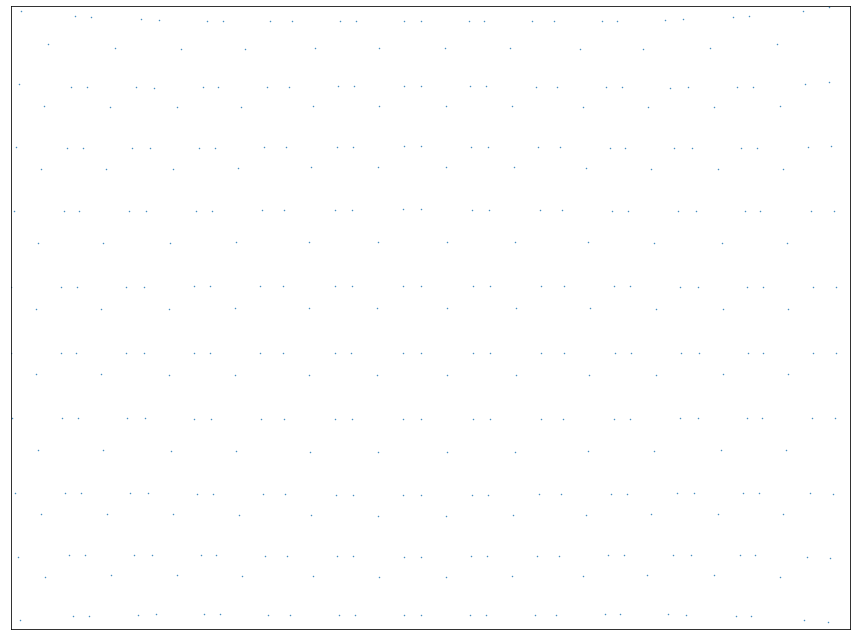

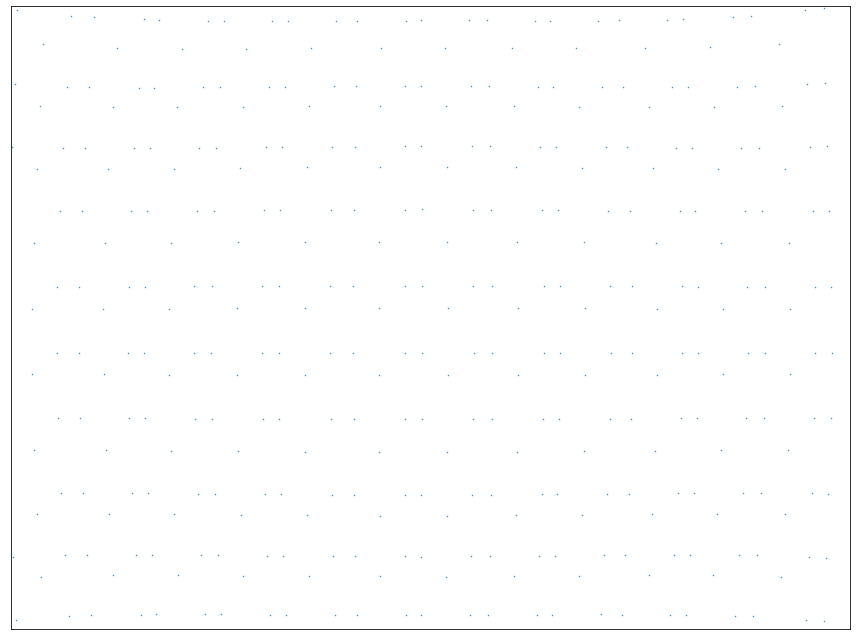

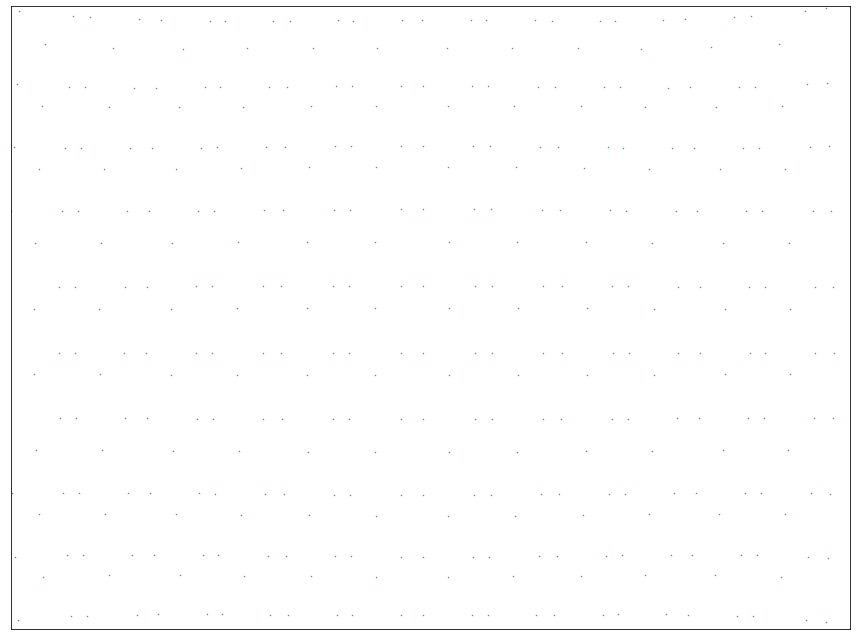

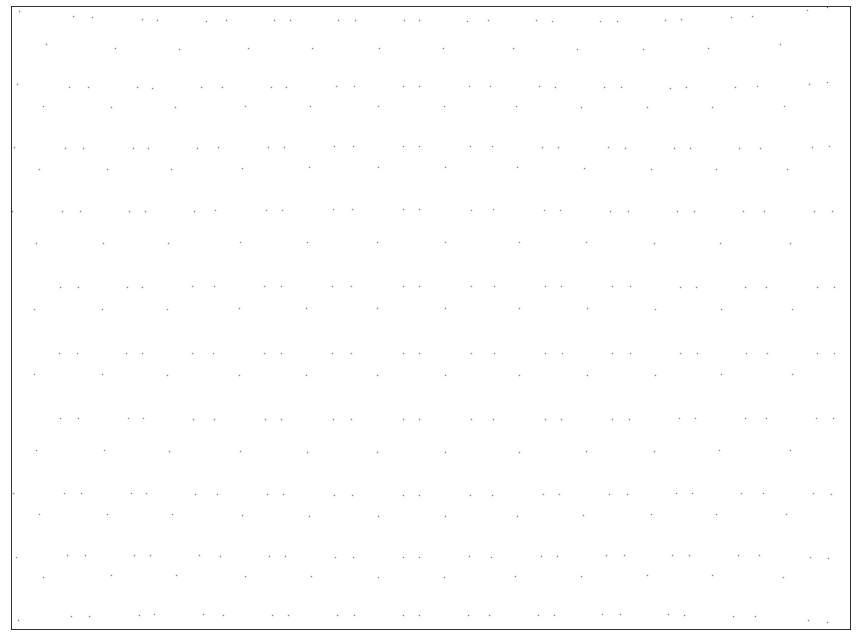

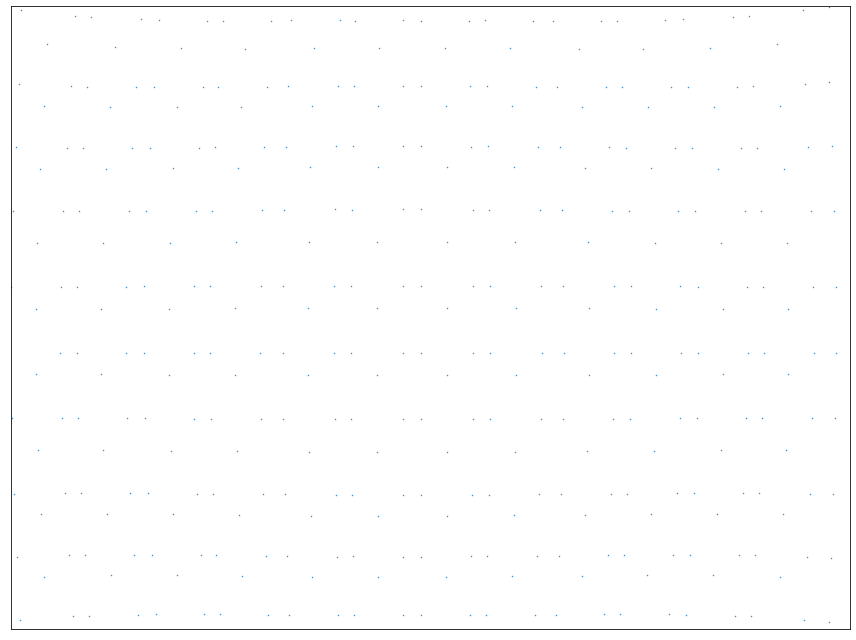

...

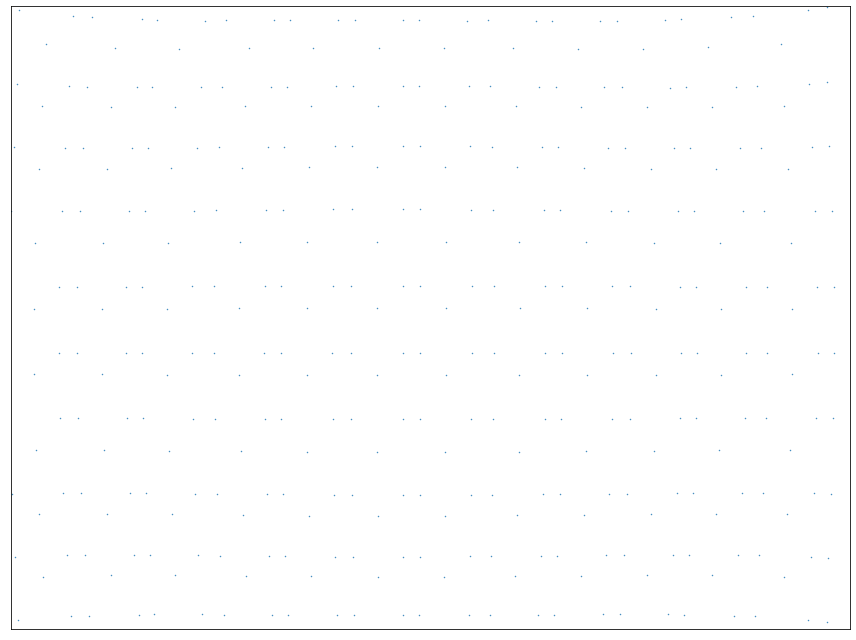

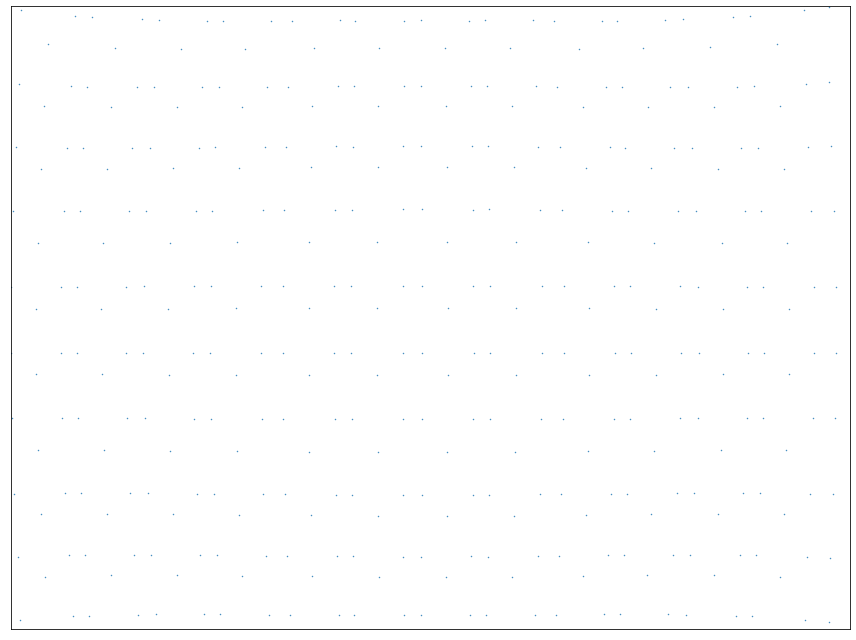

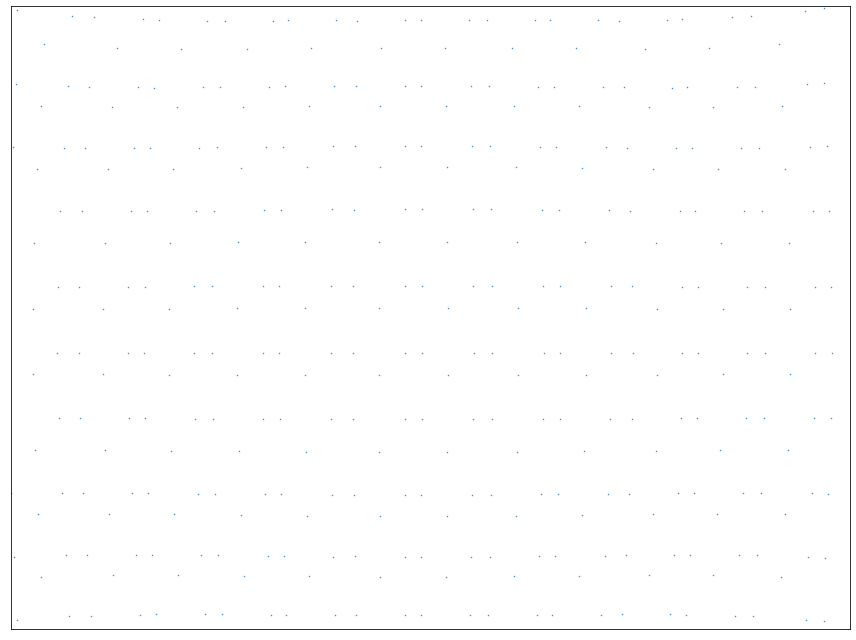

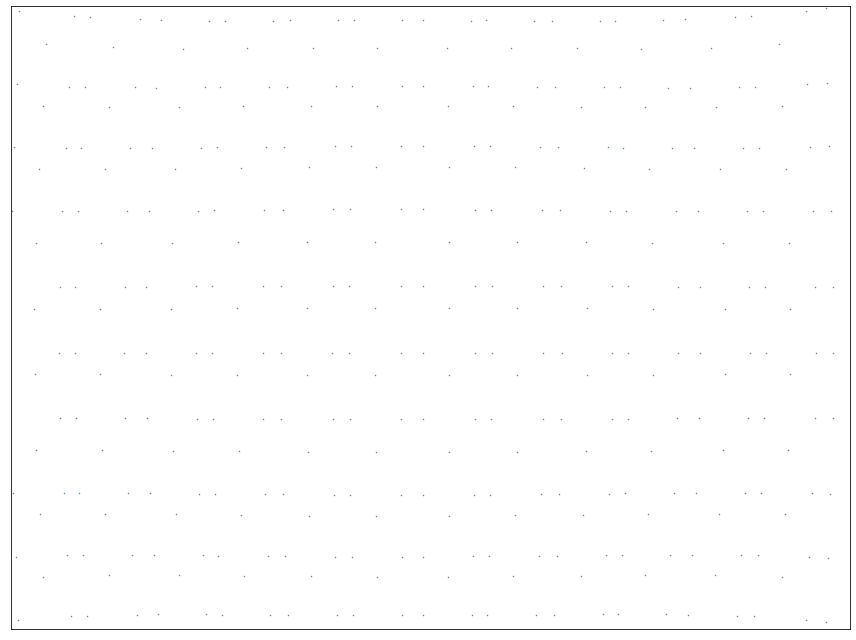

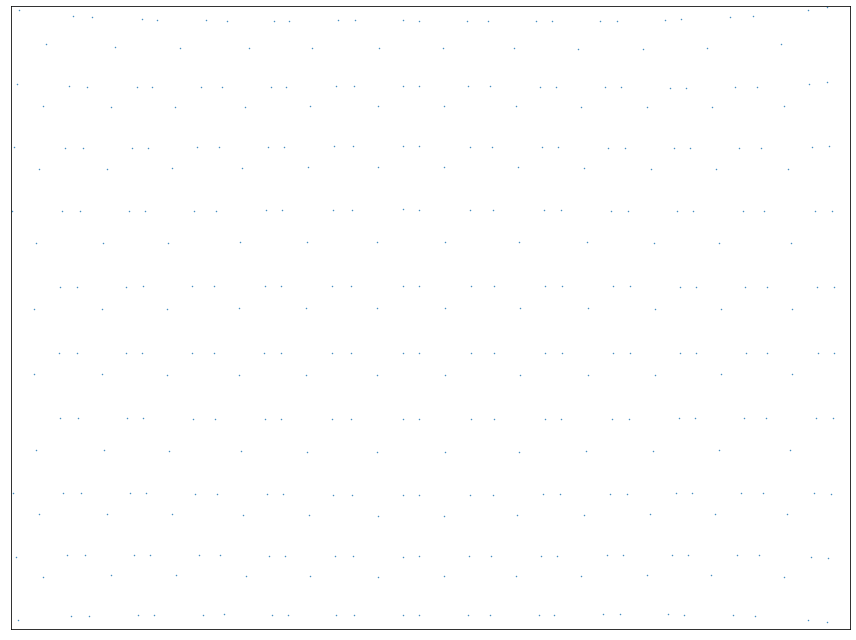

In [19]:
bolt_count = 3
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 1950})
50 images with total of  1950 features
image 0 reprojection errors:    average: 6.0508082245223545    max: 16.18285171112713
image 1 reprojection errors:    average: 6.523912328167724    max: 17.432535840261863
image 2 reprojection errors:    average: 6.6942947097195935    max: 15.60360769972705
image 3 reprojection errors:    average: 6.58862504104884    max: 17.03858923930578
image 4 reprojection errors:    average: 6.895177891364324    max: 16.9660568830362
image 5 reprojection errors:    average: 5.545823811825098    max: 14.076368106939846
image 6 reprojection errors:    average: 6.57279558357103    max: 15.50705854107308
image 7 reprojection errors:    average: 6.155189019080809    max: 14.063520361839798
image 8 reprojection errors:    average: 6.1293738904735235    max: 16.44558615766686
image 9 reprojection errors:    average: 5.439840125493611    max: 15.191580065410193
image 1

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.0721e+05                                    1.66e+06    
       1              2         6.0087e+03      1.01e+05       7.02e+01       2.00e+04    
       2              3         3.5390e+03      2.47e+03       6.19e+01       4.79e+04    
       3              4         2.9750e+03      5.64e+02       1.07e+01       3.14e+03    
       4              5         2.8215e+03      1.54e+02       5.75e+00       1.27e+03    
       5              6         2.7314e+03      9.01e+01       3.76e+00       4.05e+02    
       6              7         2.6832e+03      4.82e+01       2.24e+00       3.62e+02    
       7              8         2.6679e+03      1.52e+01       6.25e-01       2.15e+02    
`xtol` termination condition is satisfied.
Function evaluations 8, initial cost 1.0721e+05, final cost 2.6679e+03, first-order optimality 2.15e+02.
mean reprojection error: 0.899271

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.3316e+05                                    2.04e+06    
       1              2         1.6192e+04      1.17e+05       7.63e+01       3.06e+04    
       2              3         1.0471e+04      5.72e+03       9.29e+01       3.52e+04    
       3              4         9.0548e+03      1.42e+03       1.73e+01       6.76e+03    
       4              5         8.7261e+03      3.29e+02       7.26e+00       1.17e+03    
       5              6         8.6219e+03      1.04e+02       2.87e+00       4.93e+02    
       6              7         8.5753e+03      4.67e+01       9.68e-01       3.69e+02    
       7              8         8.5390e+03      3.63e+01       1.28e+00       3.23e+02    
       8              9         8.5063e+03      3.27e+01       8.32e-01       3.21e+02    
       9             10         8.4746e+03      3.16e+01       1.19e+00       3.35e+02    

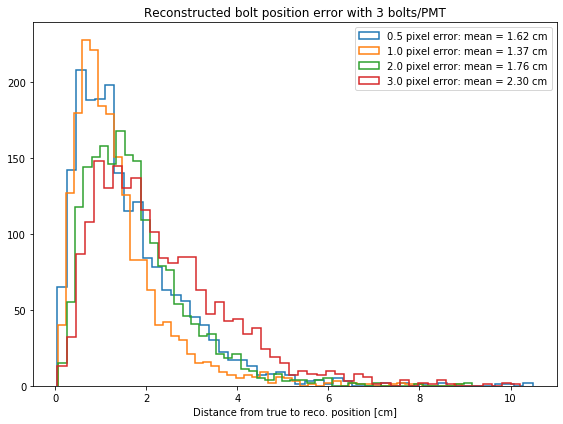

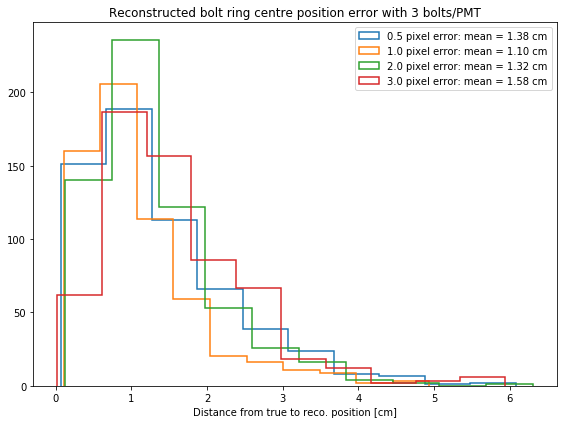

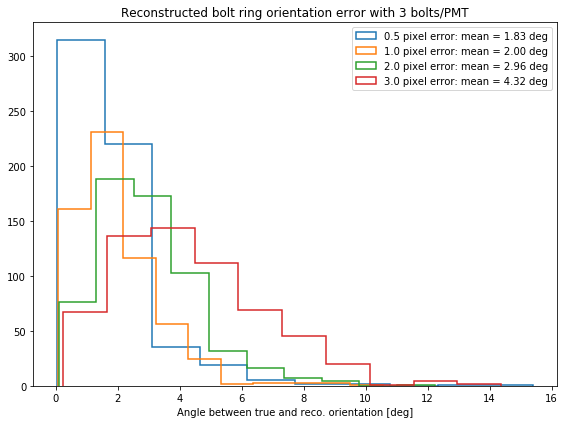

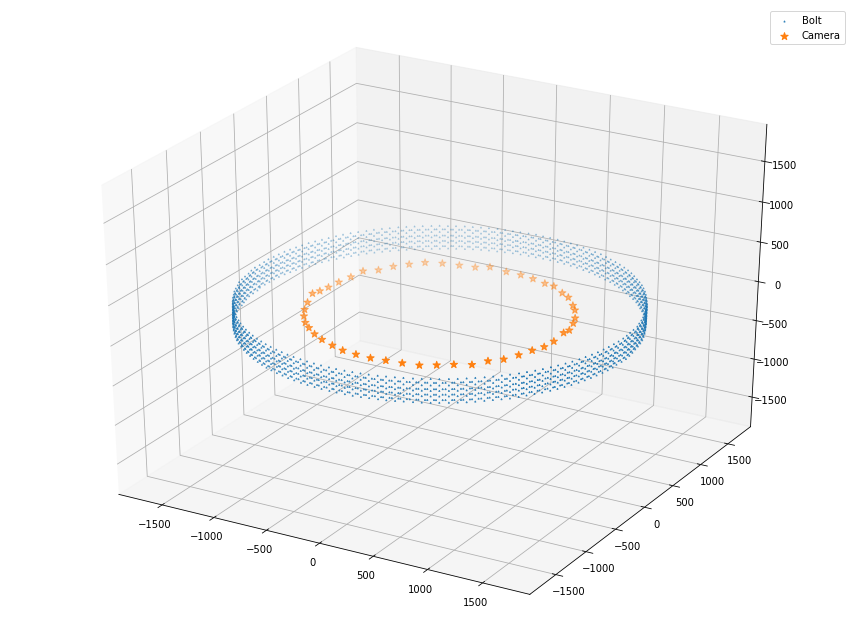

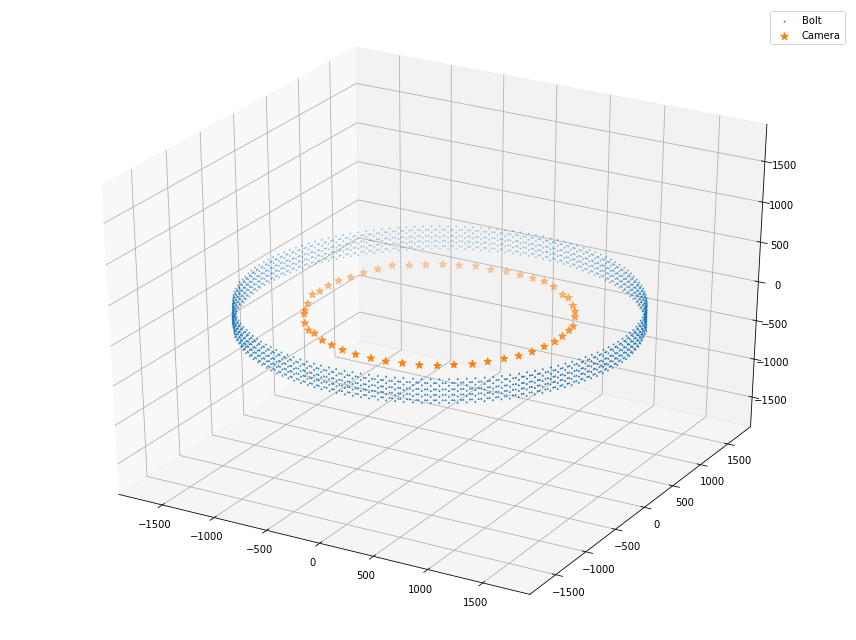

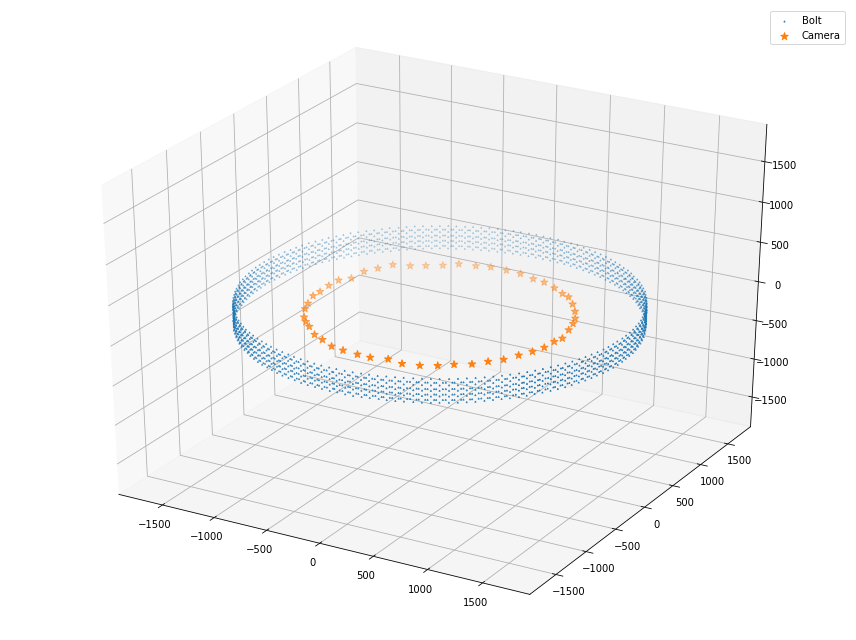

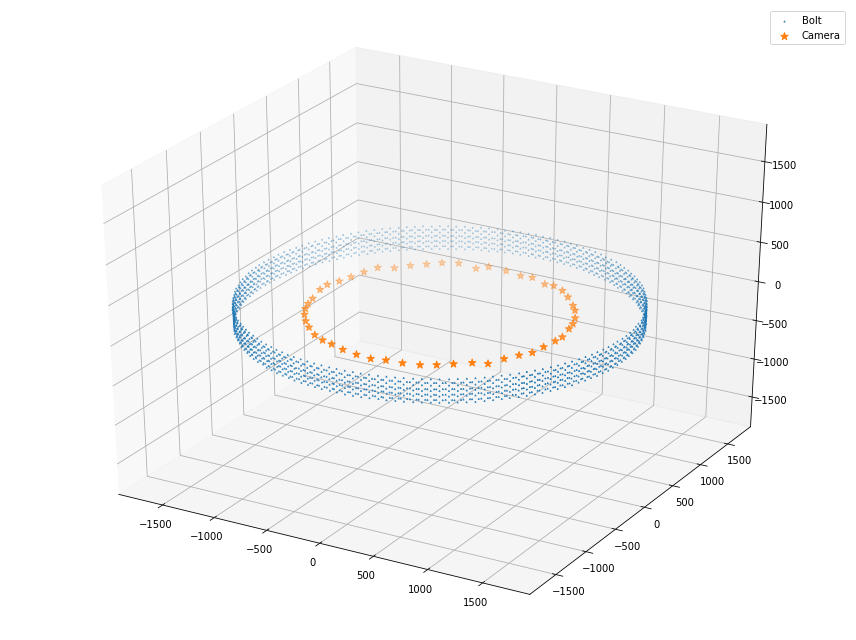

In [20]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 4 bolts

Feature in image counts: Counter({4: 5298, 3: 400, 5: 152})


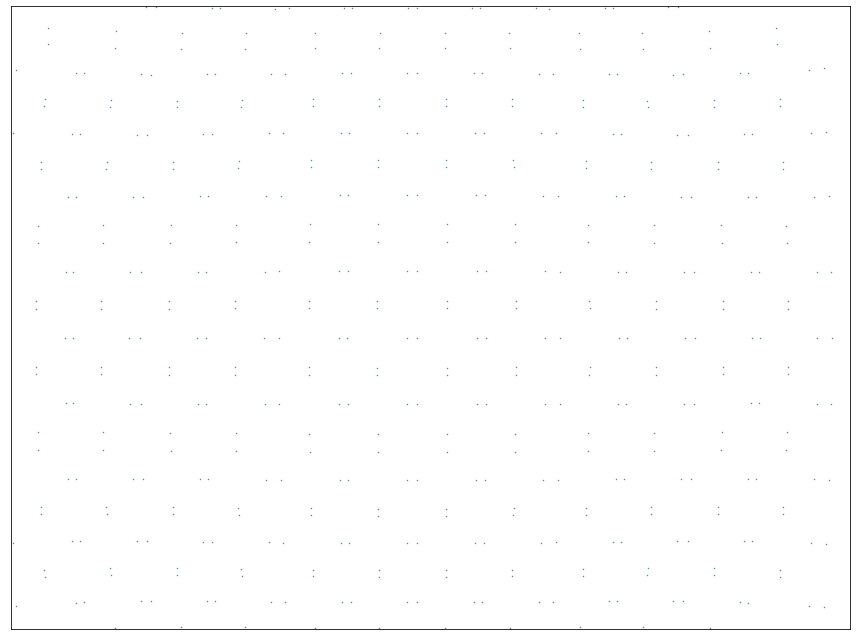

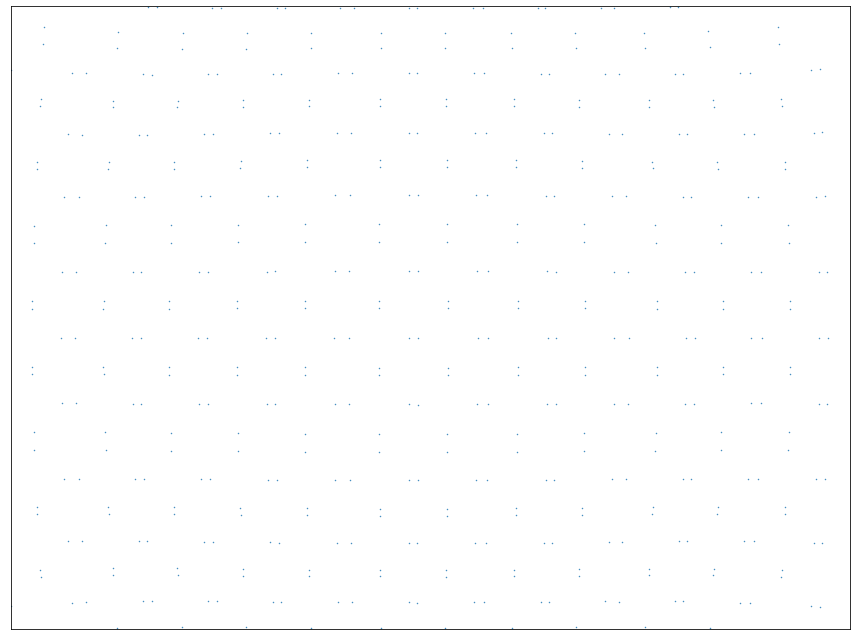

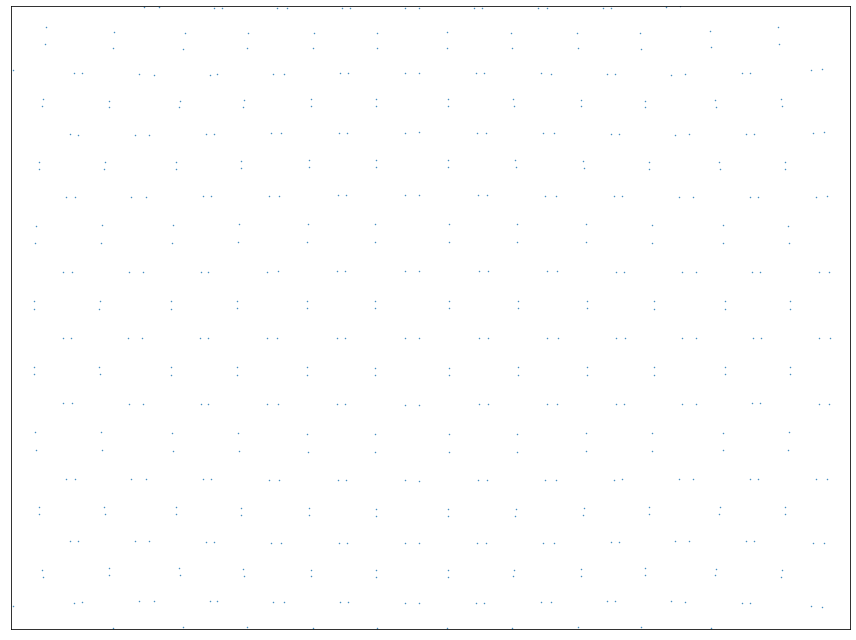

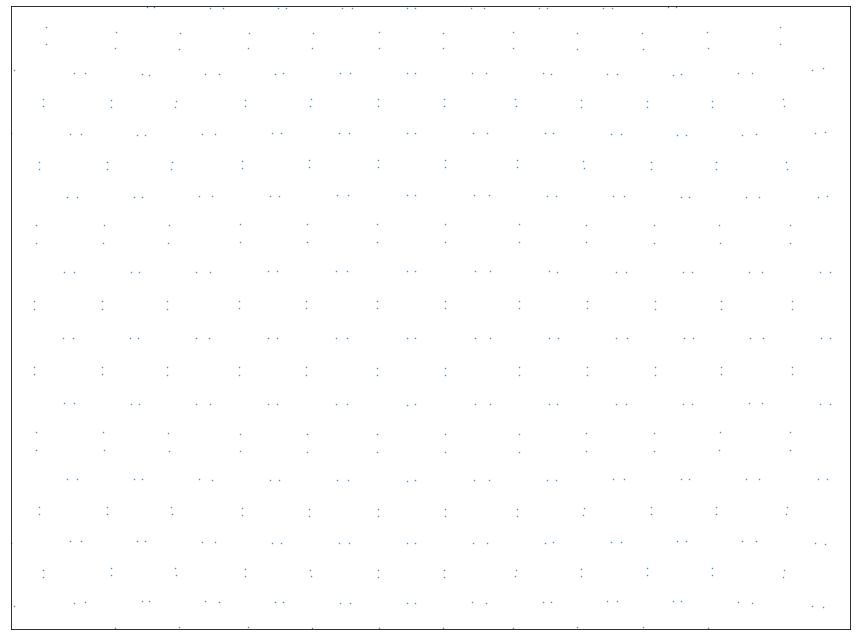

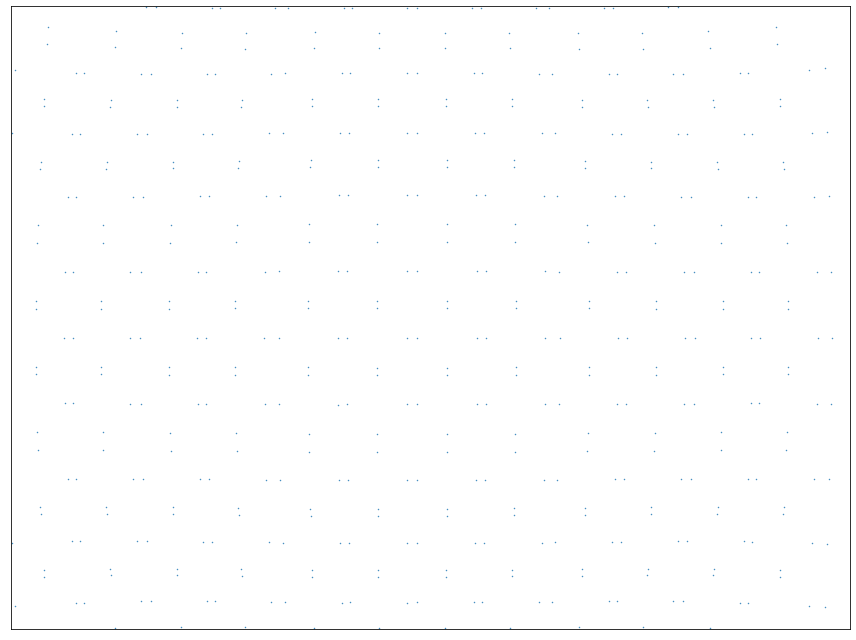

...

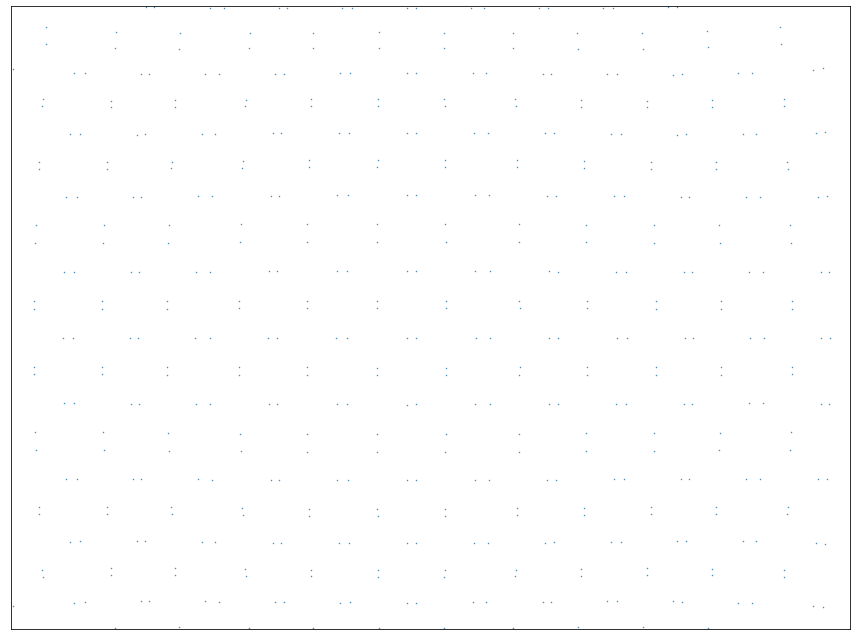

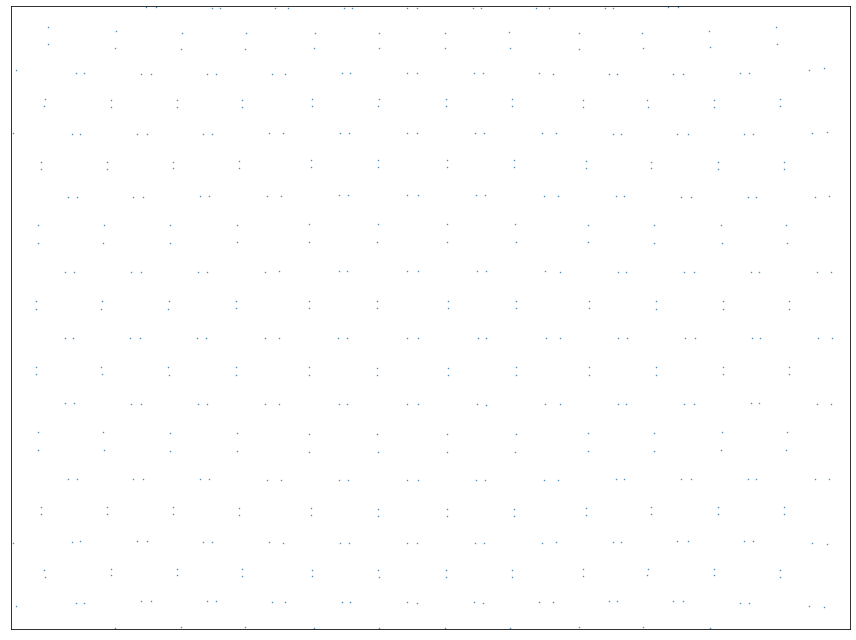

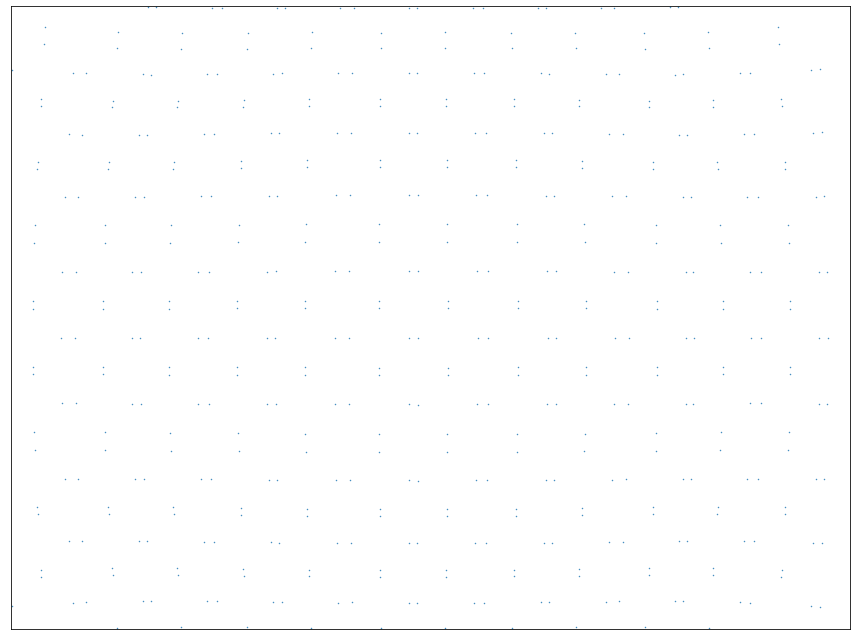

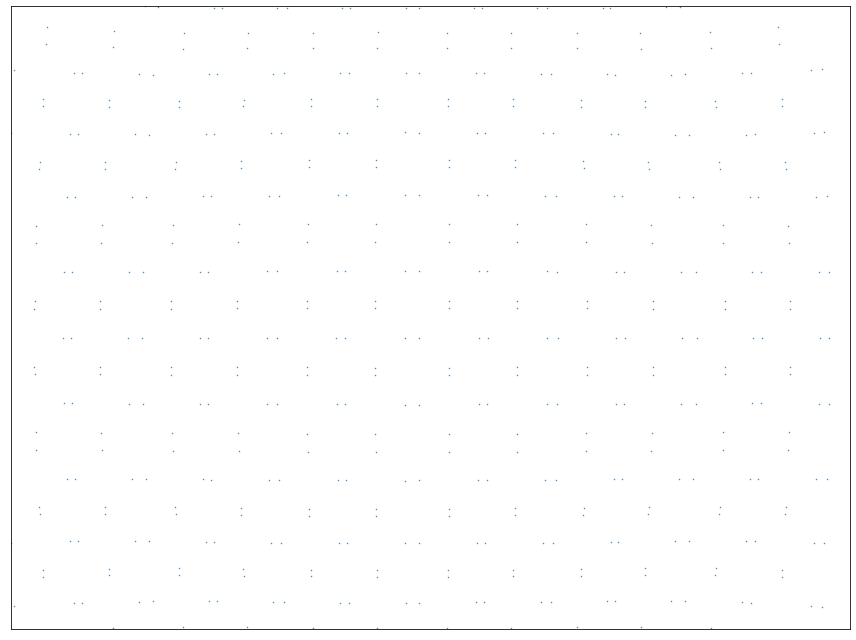

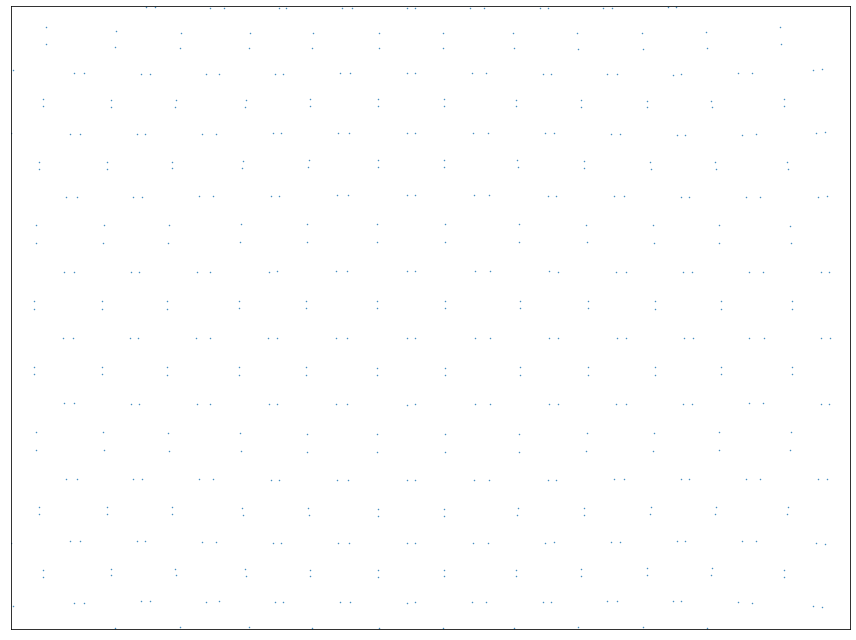

In [21]:
bolt_count = 4
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 2550})
50 images with total of  2550 features
image 0 reprojection errors:    average: 6.001747227874068    max: 15.154571002495182
image 1 reprojection errors:    average: 5.942520472460881    max: 12.982283841340498
image 2 reprojection errors:    average: 5.514149188241902    max: 19.14355083096252
image 3 reprojection errors:    average: 5.61038933420861    max: 15.455453658144053
image 4 reprojection errors:    average: 5.876438617512075    max: 14.883846013301262
image 5 reprojection errors:    average: 7.729043264703518    max: 17.18471083788175
image 6 reprojection errors:    average: 9.231863560258091    max: 24.952877475292862
image 7 reprojection errors:    average: 6.518859144386691    max: 15.001287977440093
image 8 reprojection errors:    average: 6.073545318457503    max: 20.111793258875053
image 9 reprojection errors:    average: 5.453137582686892    max: 16.522926159881955
imag

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.3496e+05                                    2.40e+06    
       1              2         7.8290e+03      1.27e+05       7.70e+01       1.25e+04    
       2              3         4.5176e+03      3.31e+03       6.75e+01       8.48e+04    
       3              4         3.5987e+03      9.19e+02       1.50e+01       6.50e+03    
       4              5         3.3835e+03      2.15e+02       5.66e+00       7.67e+02    
       5              6         3.2539e+03      1.30e+02       5.12e+00       6.67e+02    
       6              7         3.1585e+03      9.54e+01       3.01e+00       3.74e+02    
       7              8         3.1386e+03      1.99e+01       6.37e-01       2.25e+02    
`xtol` termination condition is satisfied.
Function evaluations 8, initial cost 1.3496e+05, final cost 3.1386e+03, first-order optimality 2.25e+02.
mean reprojection error: 0.912064

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.6335e+05                                    2.27e+06    
       1              2         2.0159e+04      1.43e+05       8.00e+01       9.18e+03    
       2              3         1.4285e+04      5.87e+03       7.88e+01       5.58e+04    
       3              4         1.1951e+04      2.33e+03       2.40e+01       8.58e+03    
       4              5         1.1479e+04      4.72e+02       8.70e+00       2.39e+03    
       5              6         1.1187e+04      2.92e+02       5.53e+00       1.27e+03    
       6              7         1.1117e+04      6.98e+01       1.32e+00       6.40e+02    
       7              8         1.1063e+04      5.43e+01       1.05e+00       4.78e+02    
       8              9         1.1015e+04      4.85e+01       1.13e+00       5.40e+02    
       9             10         1.0969e+04      4.56e+01       9.74e-01       4.38e+02    

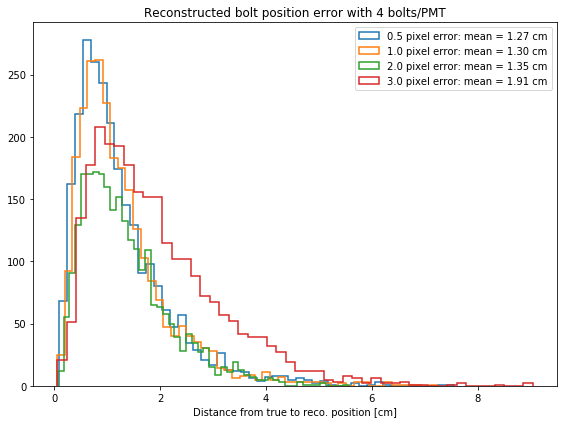

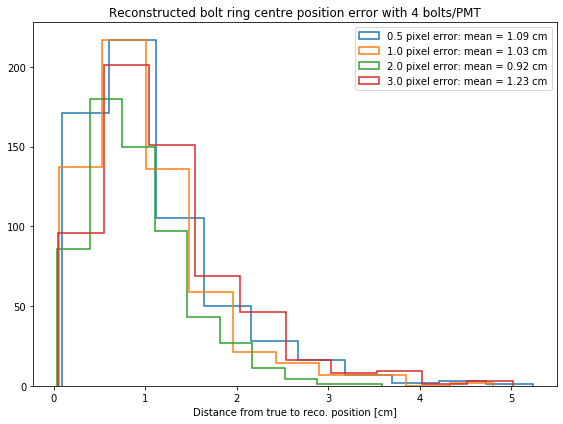

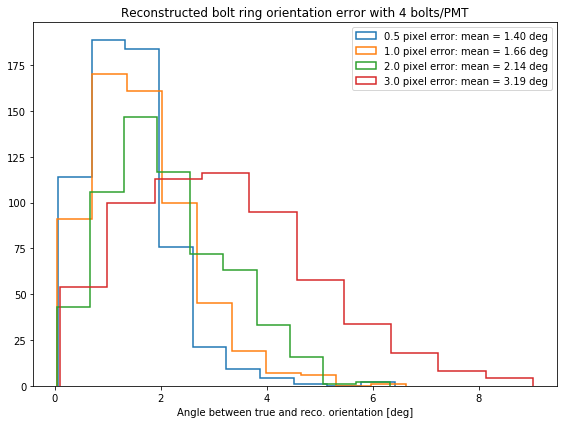

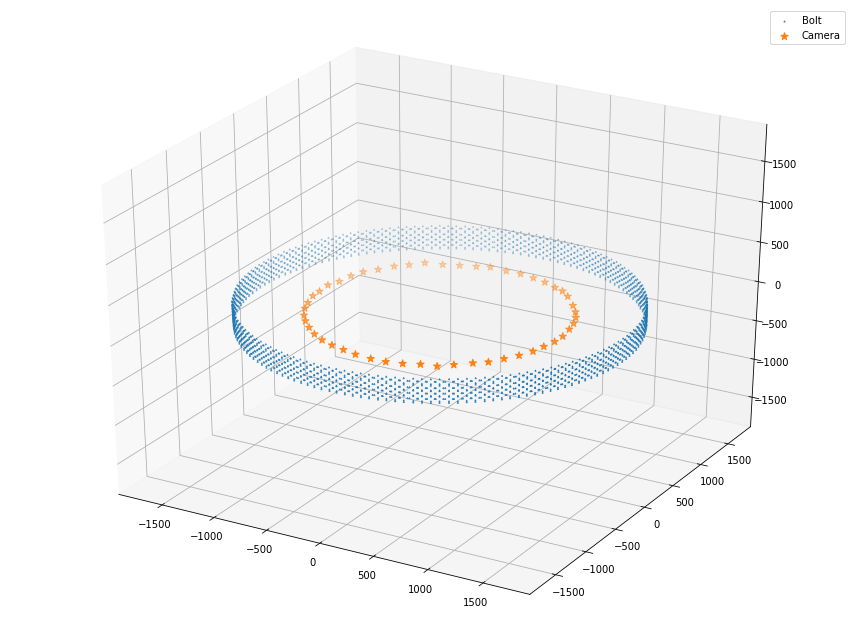

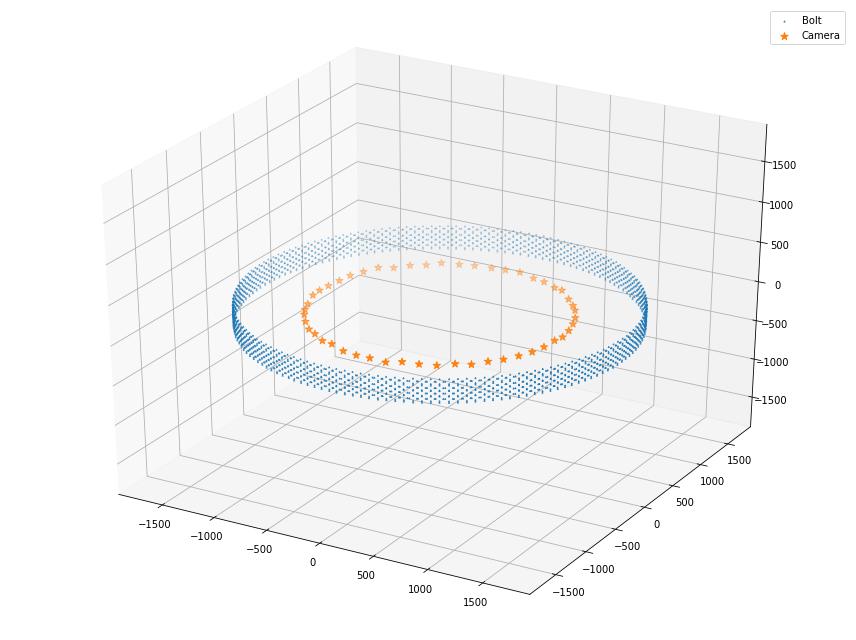

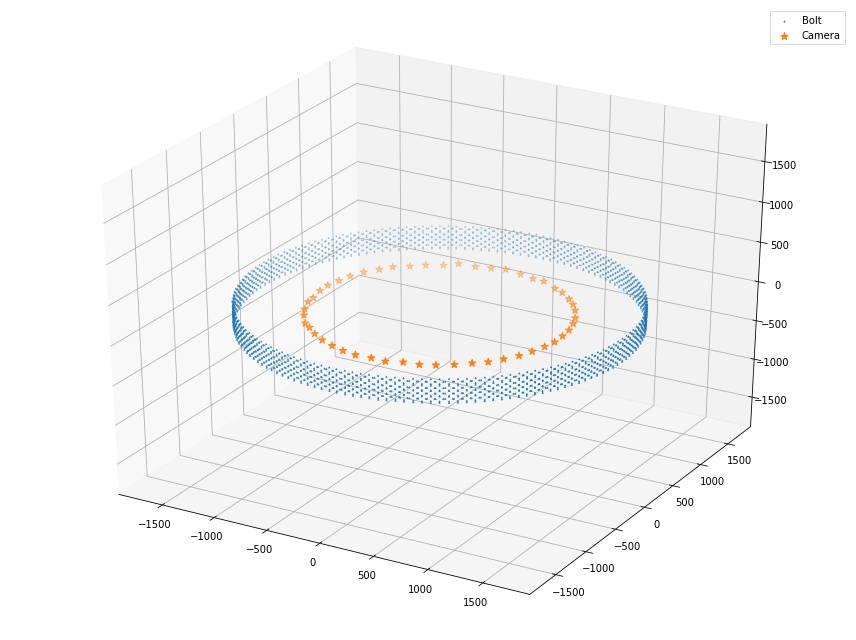

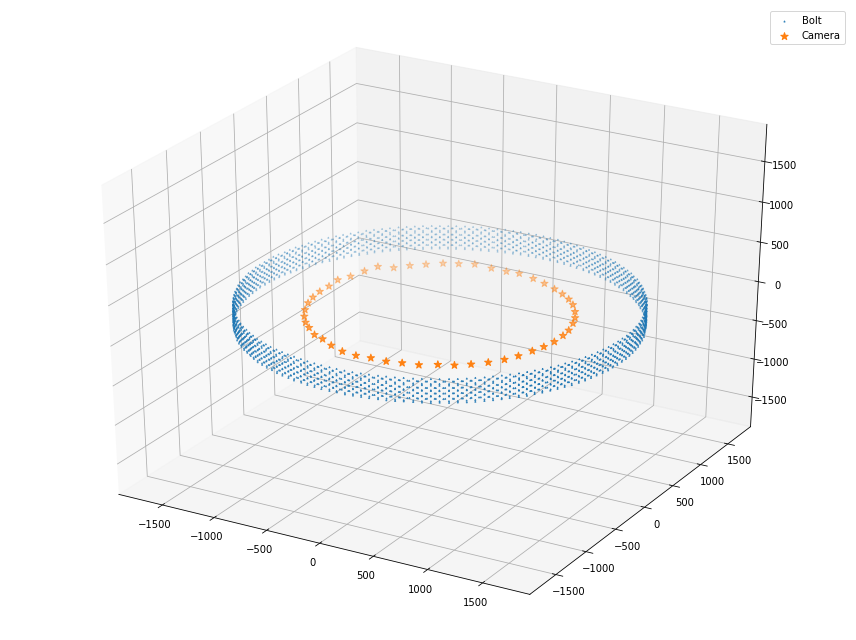

In [22]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 6 bolts

Feature in image counts: Counter({4: 7778, 5: 672, 3: 100})


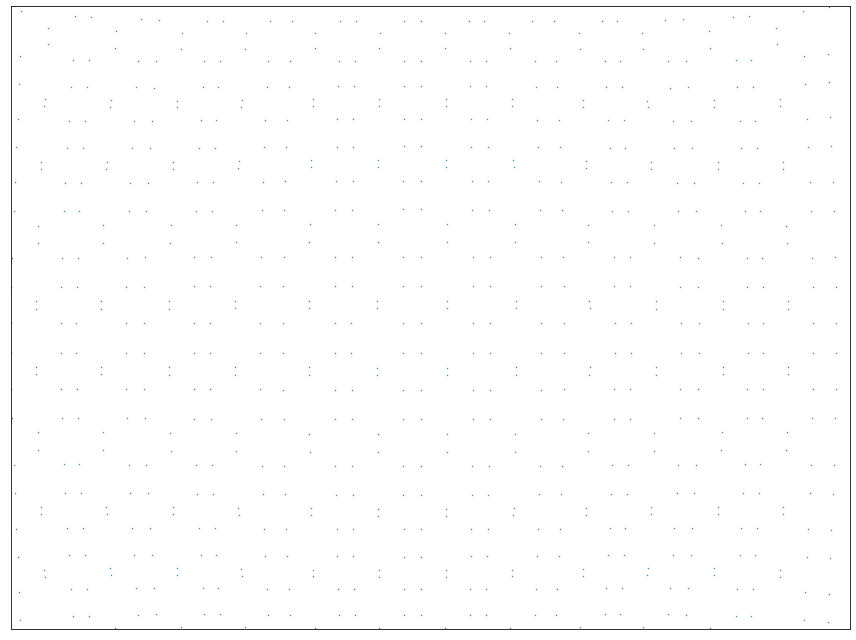

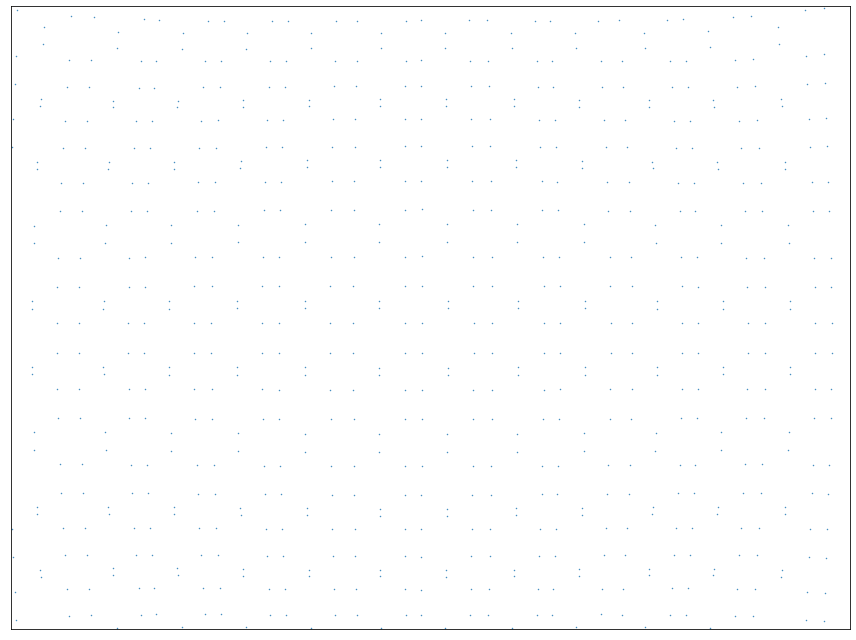

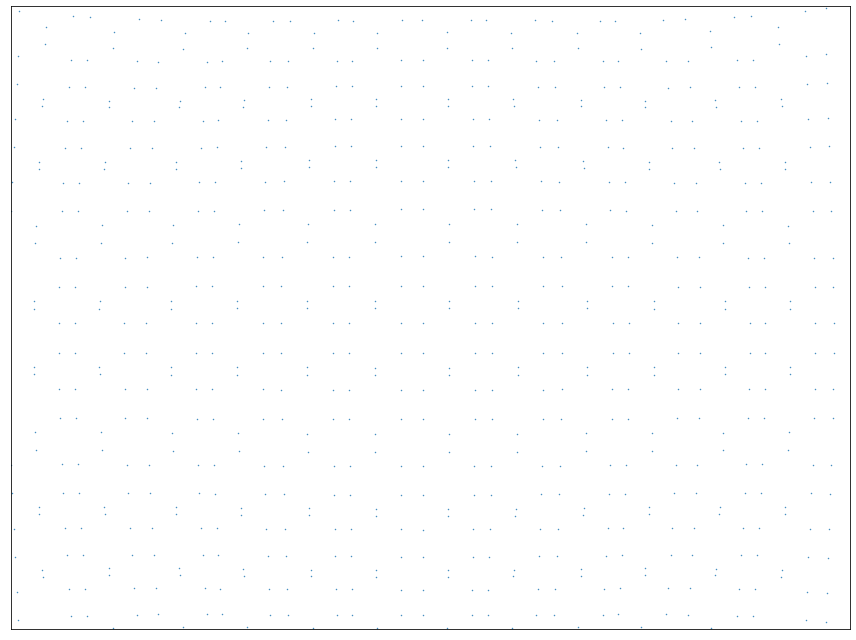

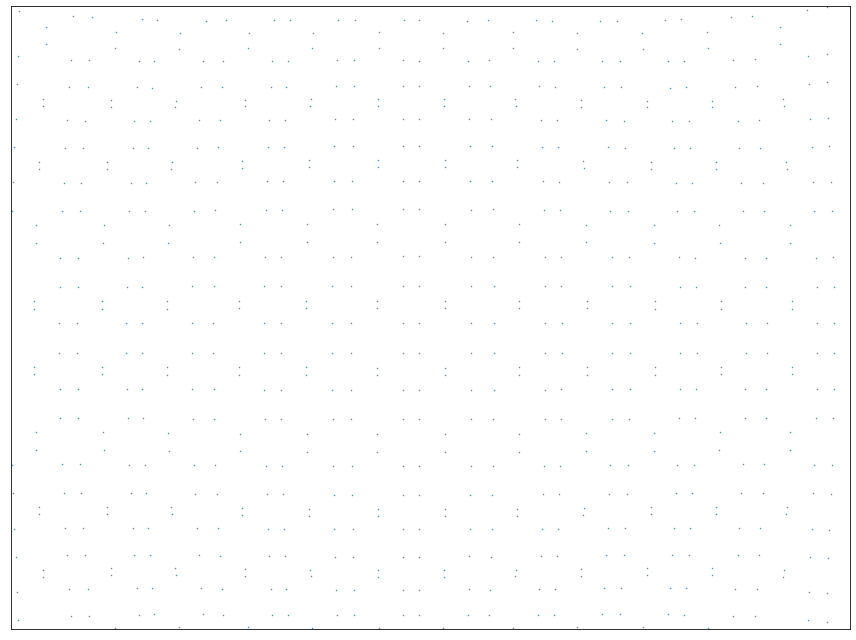

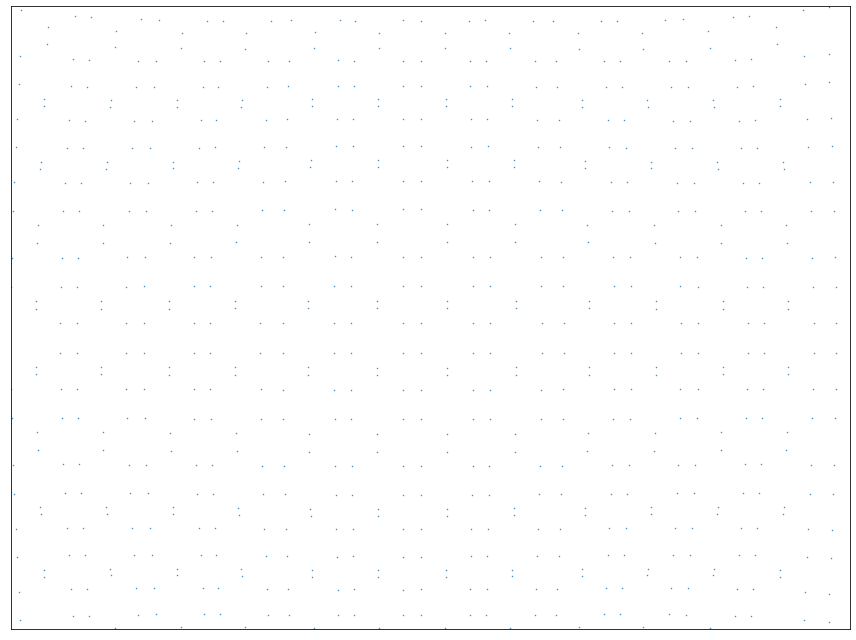

...

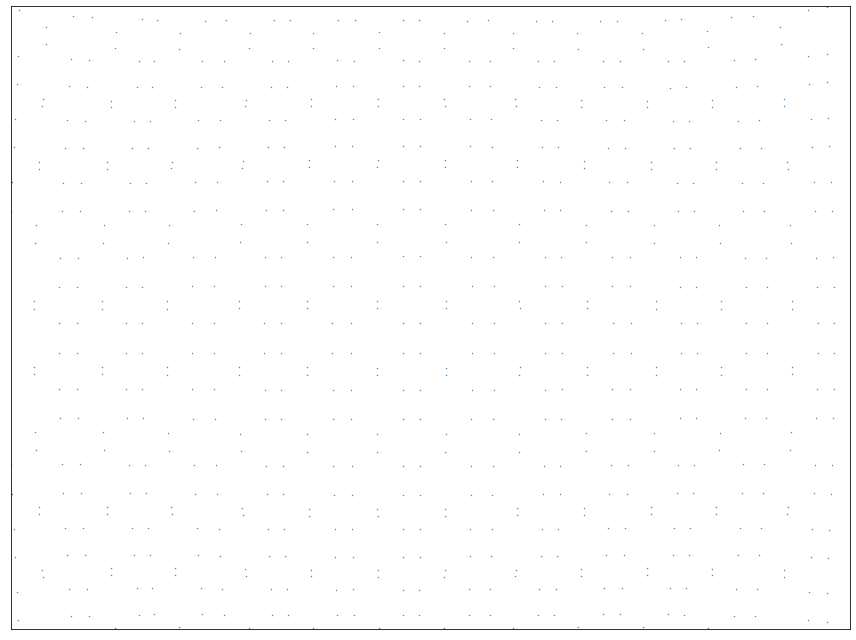

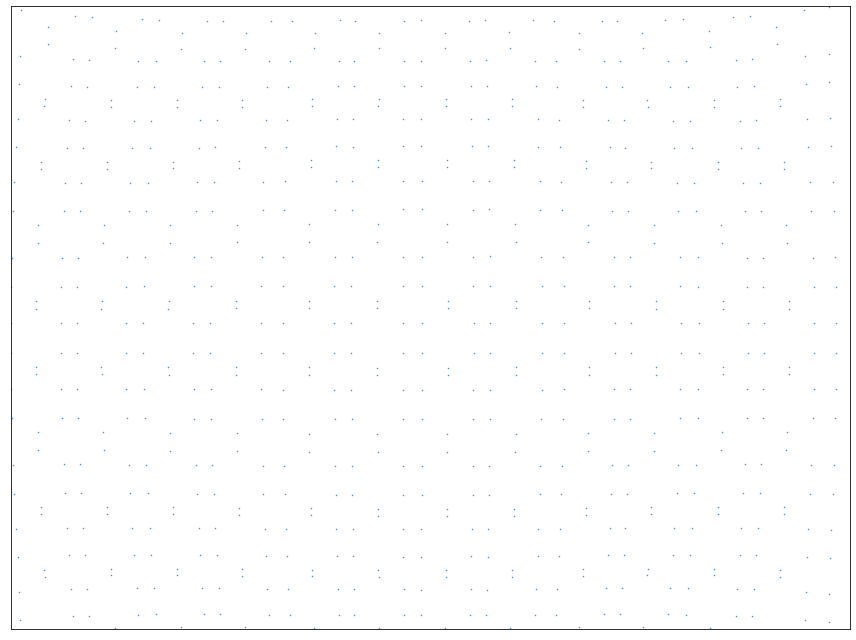

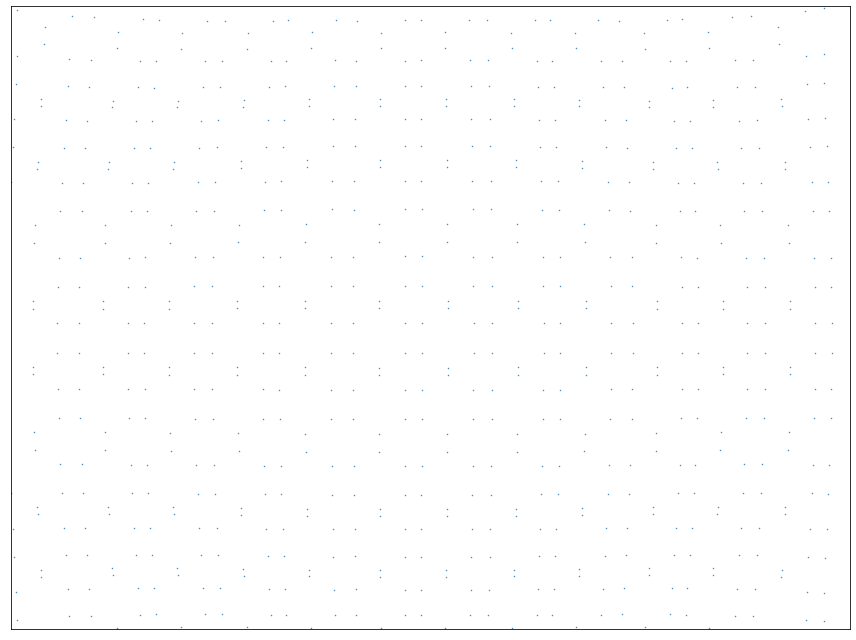

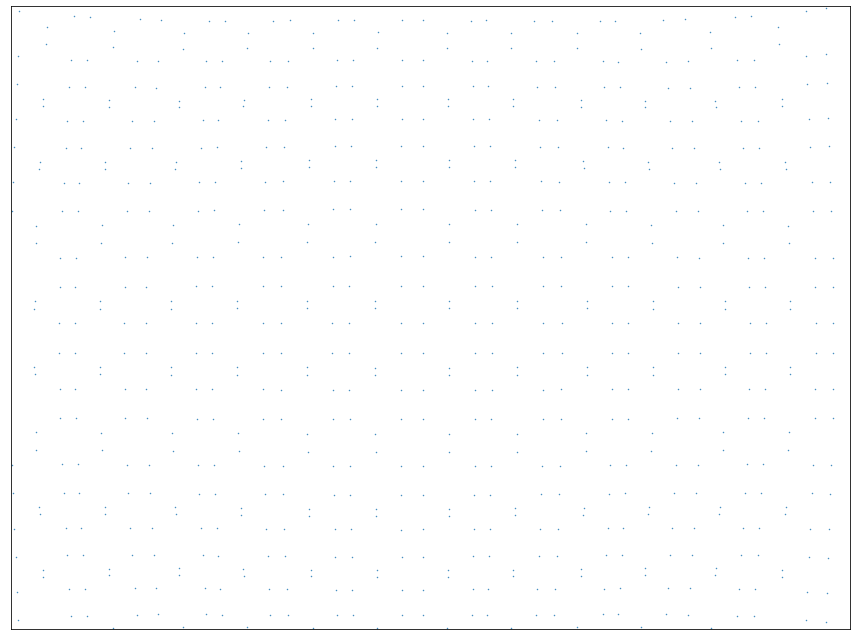

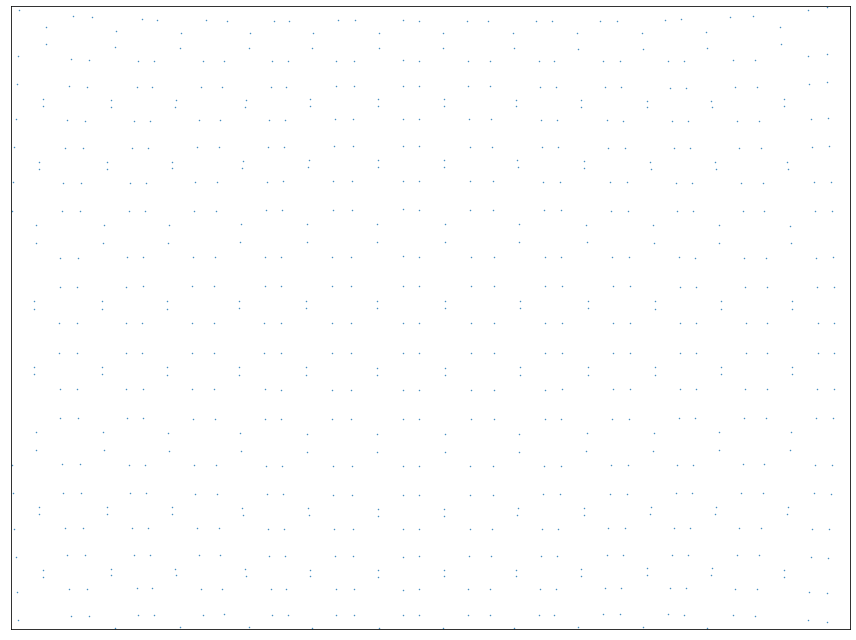

In [23]:
bolt_count = 6
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 4050})
50 images with total of  4050 features
image 0 reprojection errors:    average: 6.2280535407967825    max: 17.789106928054125
image 1 reprojection errors:    average: 6.130489682869494    max: 17.440752065871962
image 2 reprojection errors:    average: 6.814805963401672    max: 15.351344991530246
image 3 reprojection errors:    average: 6.377541365668513    max: 13.570441847871498
image 4 reprojection errors:    average: 6.0335246197472925    max: 16.018502884641244
image 5 reprojection errors:    average: 5.714351213084434    max: 13.827068745601157
image 6 reprojection errors:    average: 5.948469197904924    max: 15.109193919654881
image 7 reprojection errors:    average: 6.1489490991193    max: 17.46683944680792
image 8 reprojection errors:    average: 6.125380632568557    max: 15.418628096575443
image 9 reprojection errors:    average: 6.666218900946966    max: 14.33414123410441
ima

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         2.0203e+05                                    1.90e+06    
       1              2         7.3943e+03      1.95e+05       9.38e+01       1.94e+04    
       2              3         4.4800e+03      2.91e+03       5.42e+01       4.60e+04    
       3              4         3.9571e+03      5.23e+02       7.55e+00       4.02e+03    
       4              5         3.7050e+03      2.52e+02       6.25e+00       1.27e+03    
       5              6         3.5329e+03      1.72e+02       4.05e+00       4.11e+02    
       6              7         3.4226e+03      1.10e+02       3.35e+00       5.11e+02    
       7              8         3.3398e+03      8.28e+01       2.09e+00       4.91e+02    
       8              9         3.3183e+03      2.16e+01       4.62e-01       1.73e+02    
`xtol` termination condition is satisfied.
Function evaluations 9, initial cost 2.0203e+05

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         2.4944e+05                                    2.46e+06    
       1              2         3.0439e+04      2.19e+05       9.78e+01       1.23e+04    
       2              3         2.6544e+04      3.90e+03       3.84e+01       3.01e+04    
       3              4         2.4613e+04      1.93e+03       1.26e+01       2.70e+03    
       4              5         2.3807e+04      8.06e+02       8.54e+00       7.25e+02    
       5              6         2.3047e+04      7.60e+02       8.12e+00       1.02e+03    
       6              7         2.2354e+04      6.94e+02       7.78e+00       8.38e+02    
       7              8         2.1844e+04      5.09e+02       5.51e+00       1.42e+03    
       8              9         2.1693e+04      1.51e+02       1.22e+00       3.52e+02    
       9             10         2.1560e+04      1.33e+02       2.00e+00       9.24e+02    

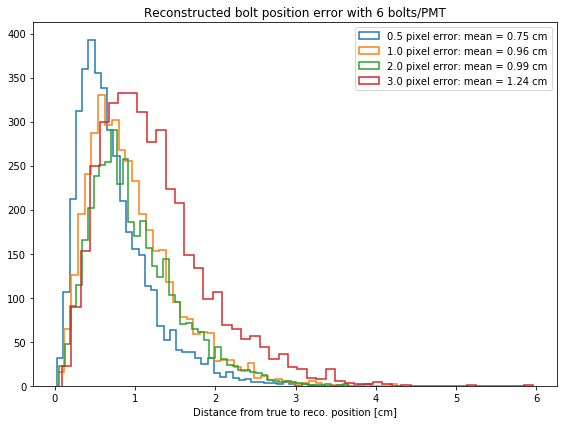

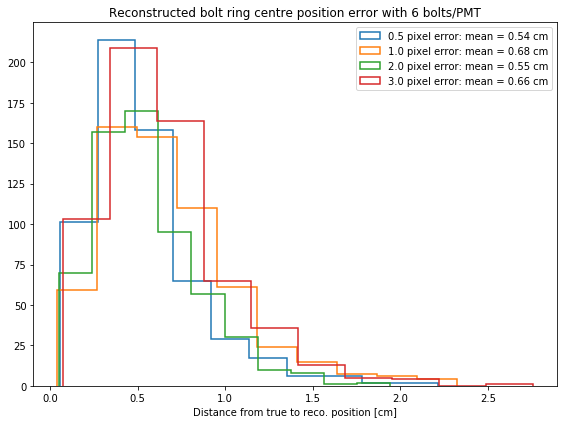

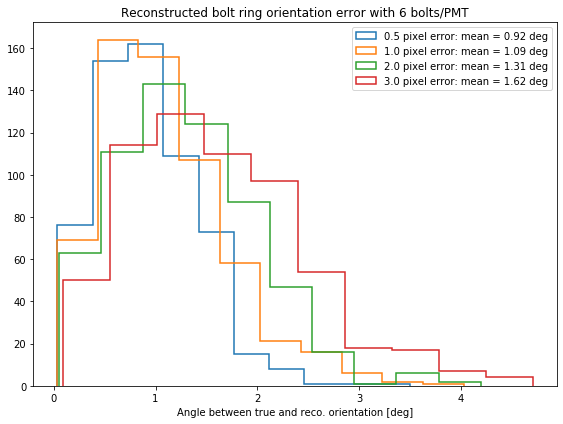

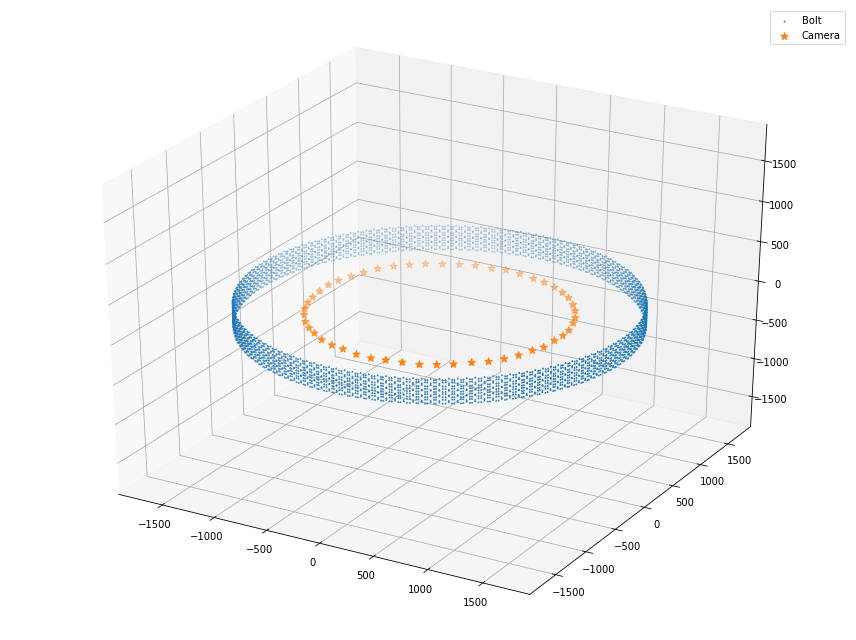

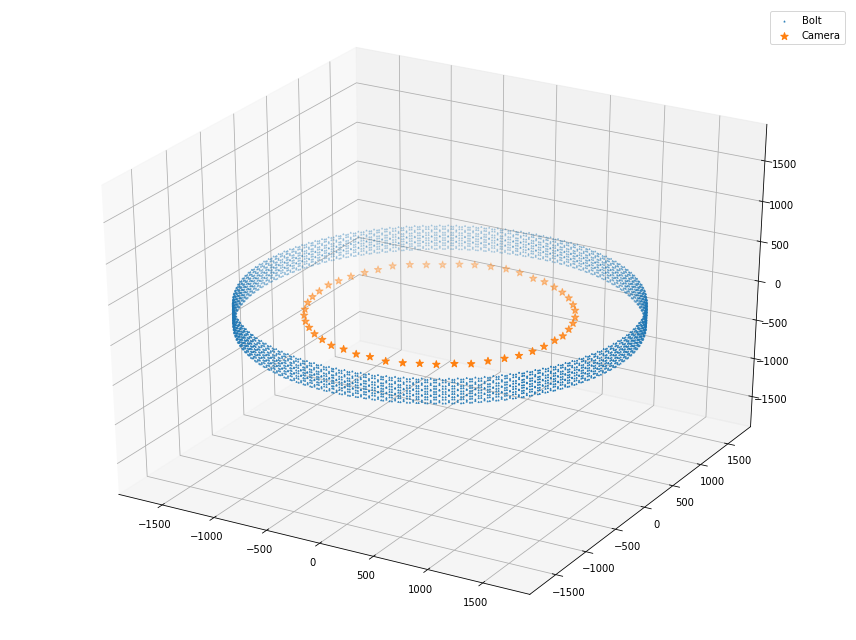

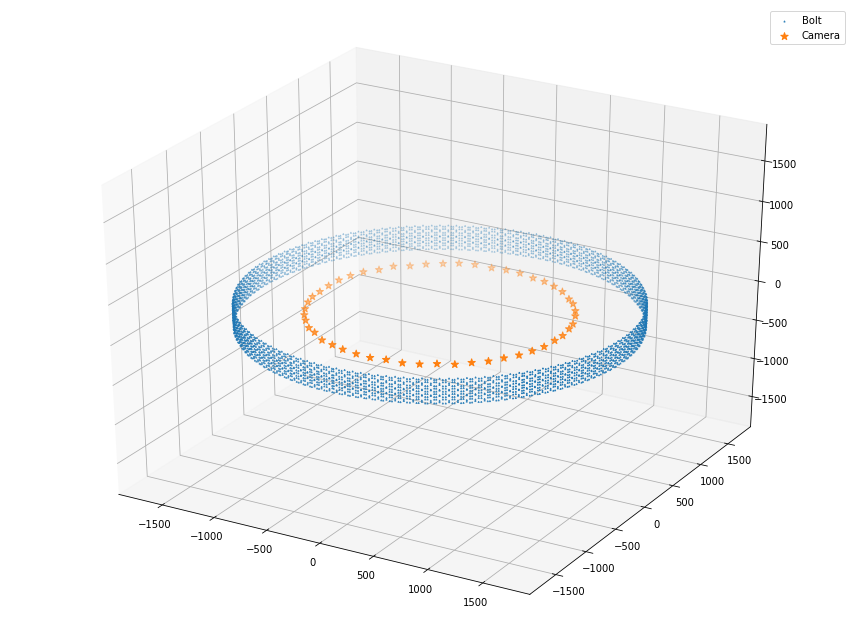

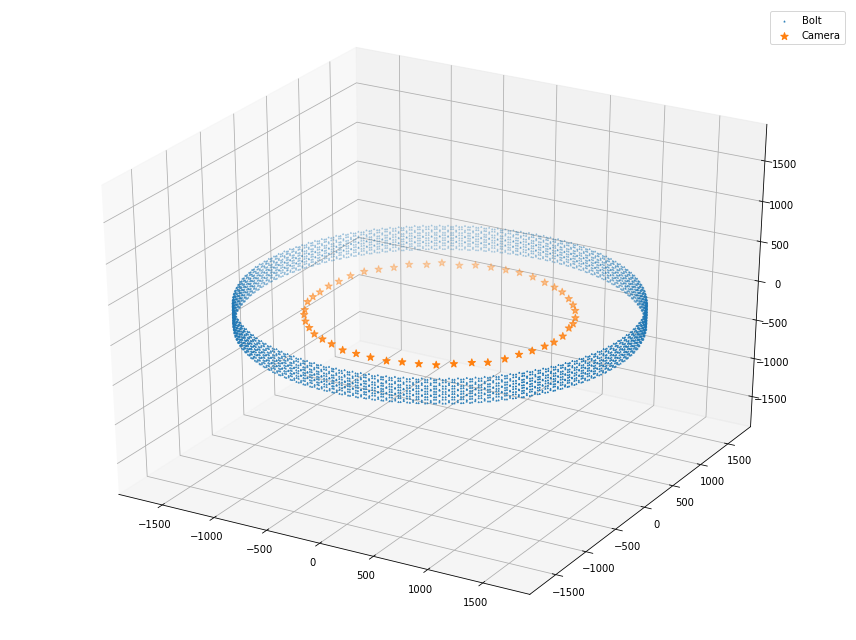

In [24]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 8 bolts

Feature in image counts: Counter({4: 10048, 5: 1102, 3: 400})


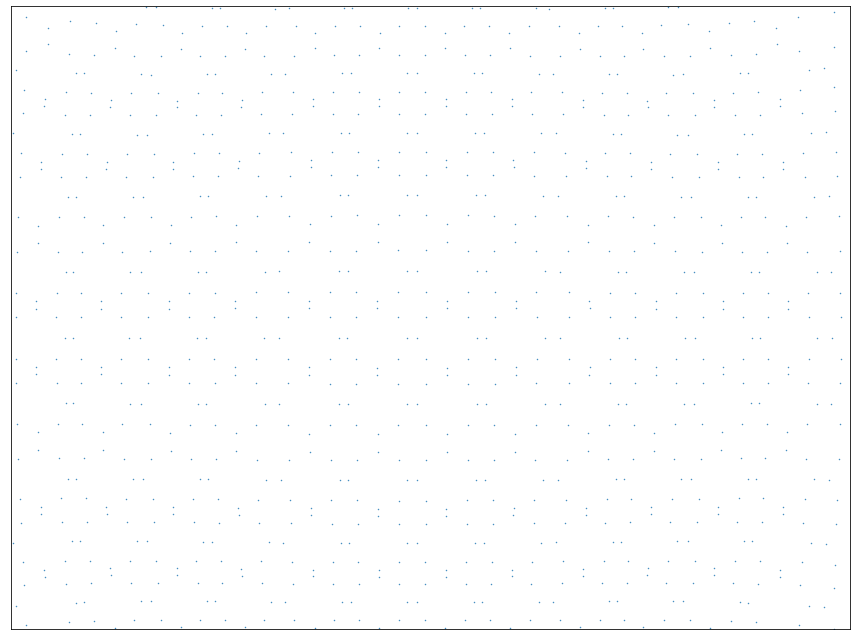

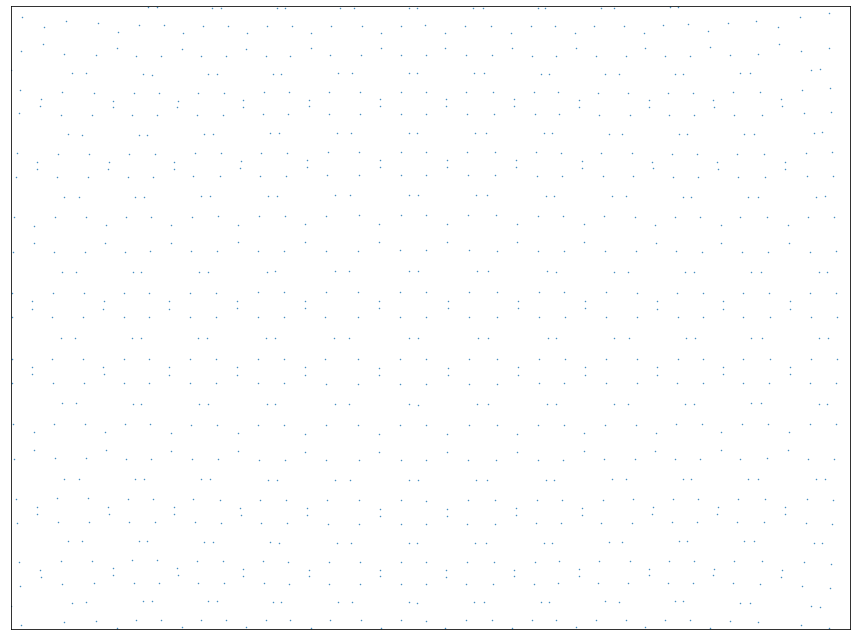

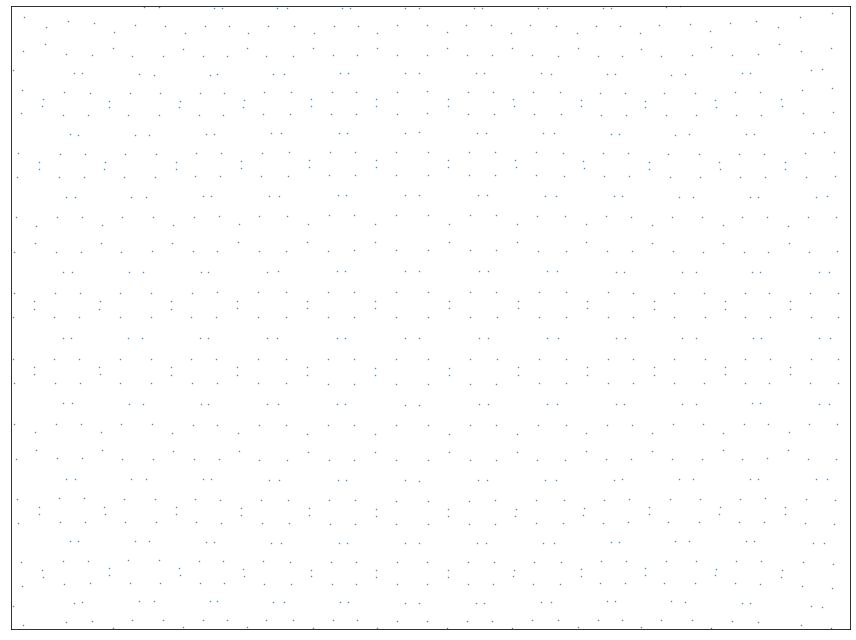

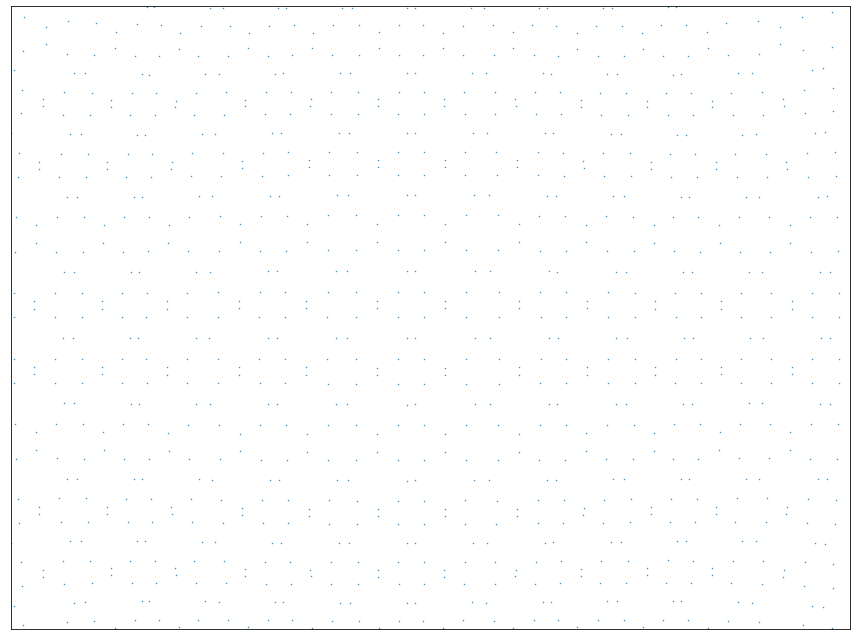

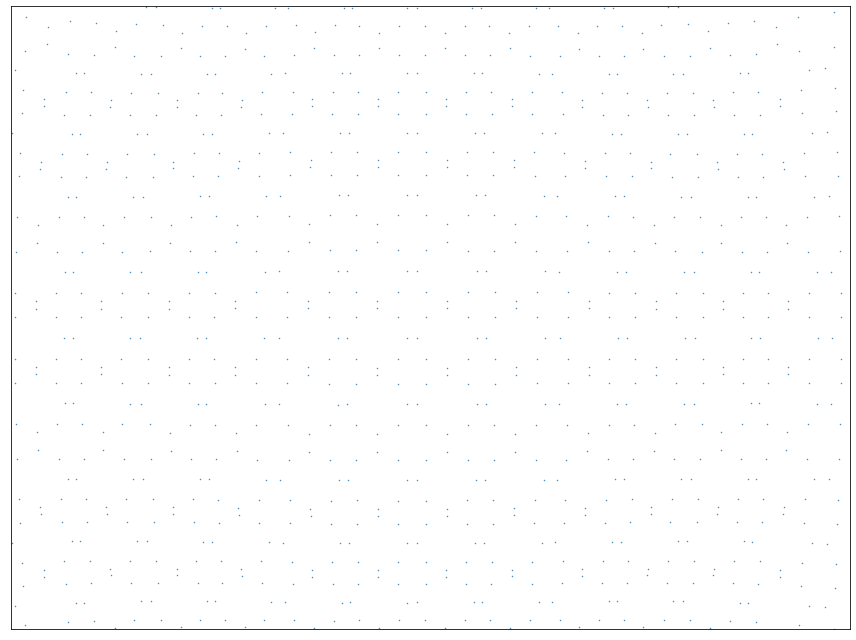

...

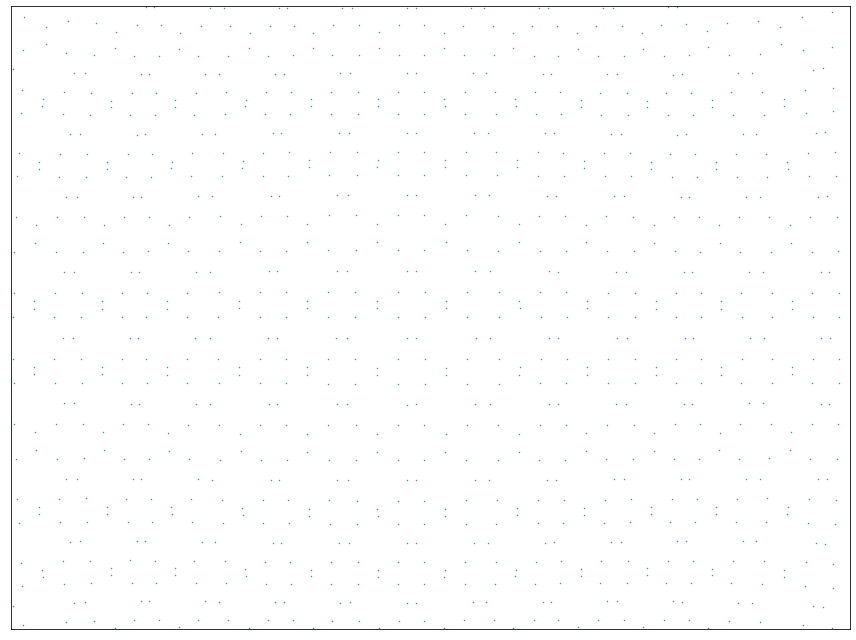

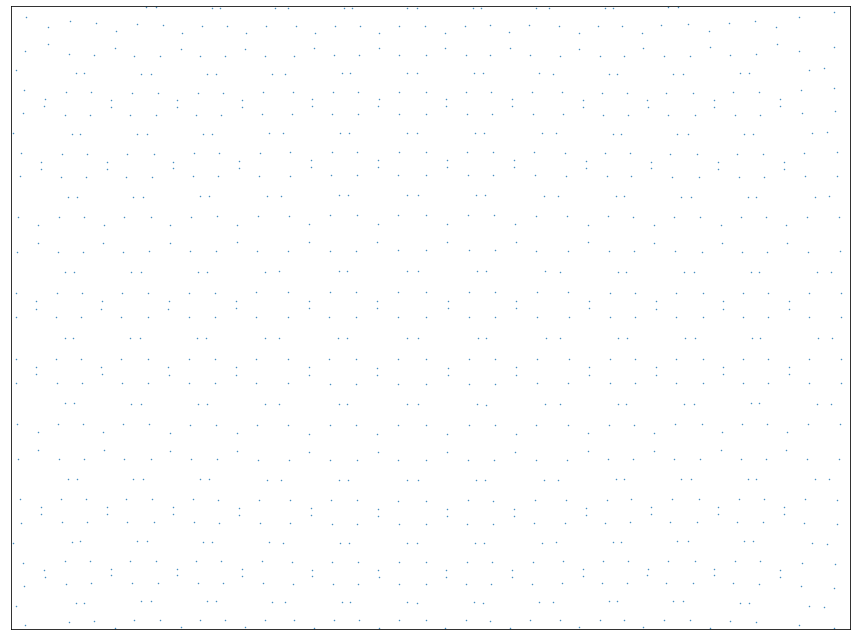

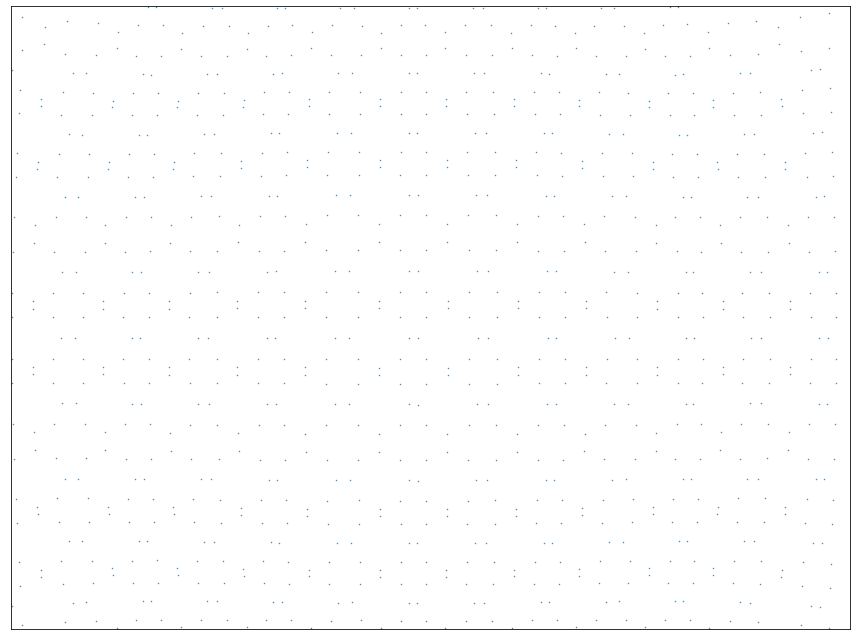

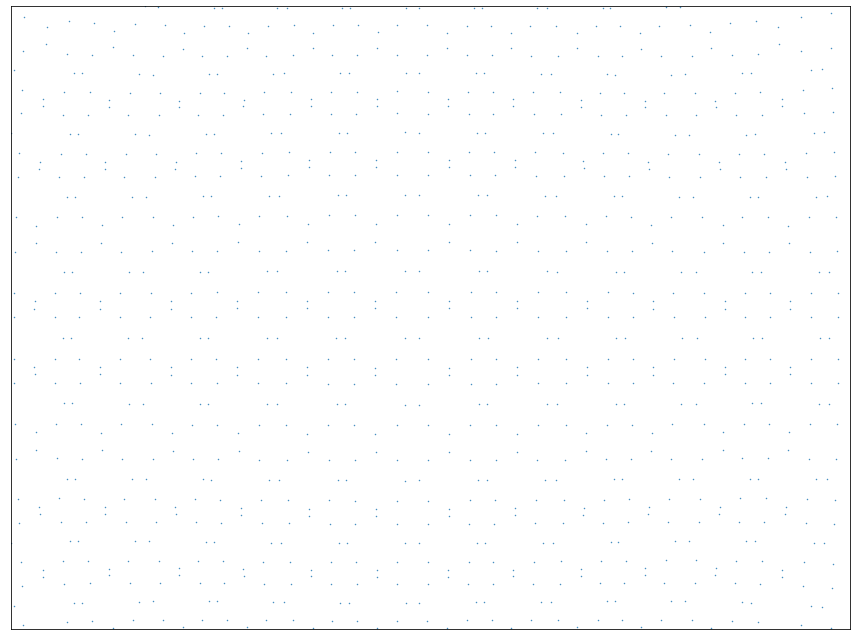

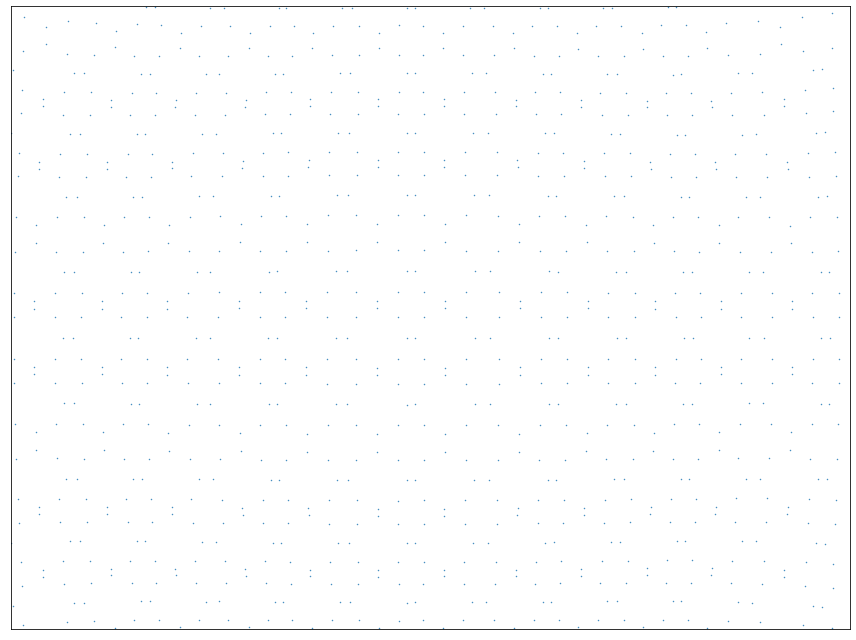

In [25]:
bolt_count = 8
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 5227, 3: 23})
50 images with total of  5250 features
image 0 reprojection errors:    average: 6.075486993286784    max: 14.904403093065165
image 1 reprojection errors:    average: 6.186958891768379    max: 17.287435888290677
image 2 reprojection errors:    average: 5.955309445287859    max: 16.062498032548753
image 3 reprojection errors:    average: 6.050402210158499    max: 20.201031319959252
image 4 reprojection errors:    average: 6.08227498862506    max: 18.403123826477962
image 5 reprojection errors:    average: 6.860066618543078    max: 19.312705038082527
image 6 reprojection errors:    average: 6.5352605531026065    max: 16.34928662101875
image 7 reprojection errors:    average: 5.552792763154236    max: 14.91733390894513
image 8 reprojection errors:    average: 5.739730765773196    max: 18.08102157660038
image 9 reprojection errors:    average: 6.1087685956201865    max: 19.992200361356

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         2.5907e+05                                    3.26e+06    
       1              2         1.0212e+04      2.49e+05       1.04e+02       2.01e+04    
       2              3         7.3305e+03      2.88e+03       3.85e+01       5.38e+04    
       3              4         6.1472e+03      1.18e+03       1.22e+01       4.03e+03    
       4              5         5.8126e+03      3.35e+02       5.89e+00       9.92e+02    
       5              6         5.5705e+03      2.42e+02       4.25e+00       3.13e+02    
       6              7         5.3724e+03      1.98e+02       3.96e+00       4.27e+02    
       7              8         5.2076e+03      1.65e+02       3.09e+00       2.87e+02    
       8              9         5.0944e+03      1.13e+02       2.26e+00       5.91e+02    
       9             10         5.0542e+03      4.02e+01       5.61e-01       1.49e+02    

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         3.0761e+05                                    2.41e+06    
       1              2         3.7131e+04      2.70e+05       1.09e+02       1.07e+04    
       2              3         3.5225e+04      1.91e+03       1.49e+01       4.56e+03    
       3              4         3.3941e+04      1.28e+03       7.75e+00       5.95e+02    
       4              5         3.3170e+04      7.70e+02       7.14e+00       2.47e+03    
       5              6         3.2808e+04      3.63e+02       1.82e+00       7.00e+02    
       6              7         3.2612e+04      1.95e+02       1.73e+00       1.24e+03    
       7              8         3.2444e+04      1.69e+02       1.26e+00       5.51e+02    
       8              9         3.2283e+04      1.61e+02       1.59e+00       1.09e+03    
       9             10         3.2128e+04      1.55e+02       1.22e+00       4.97e+02    

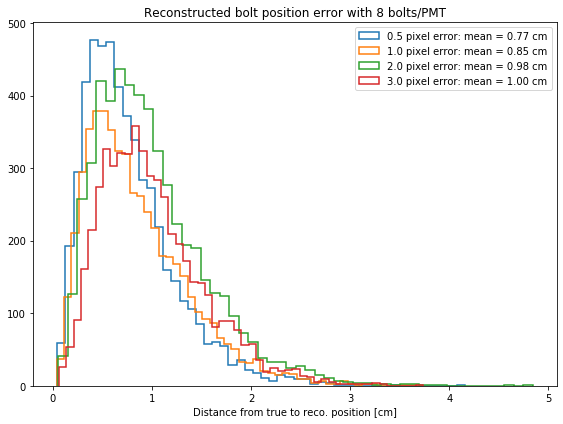

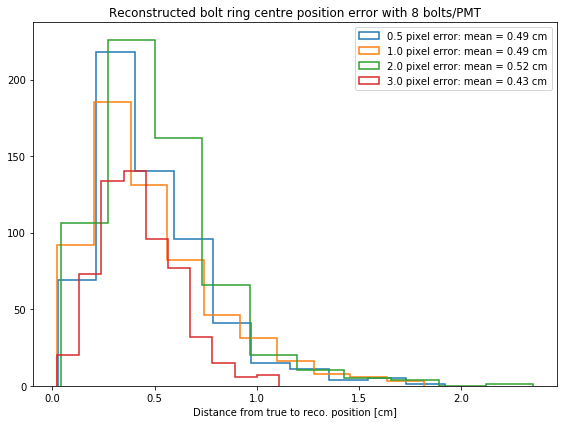

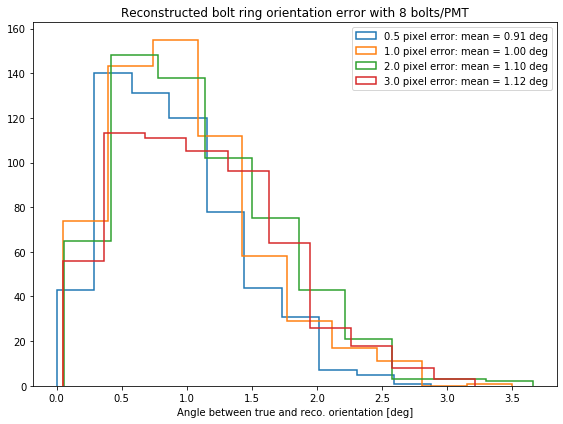

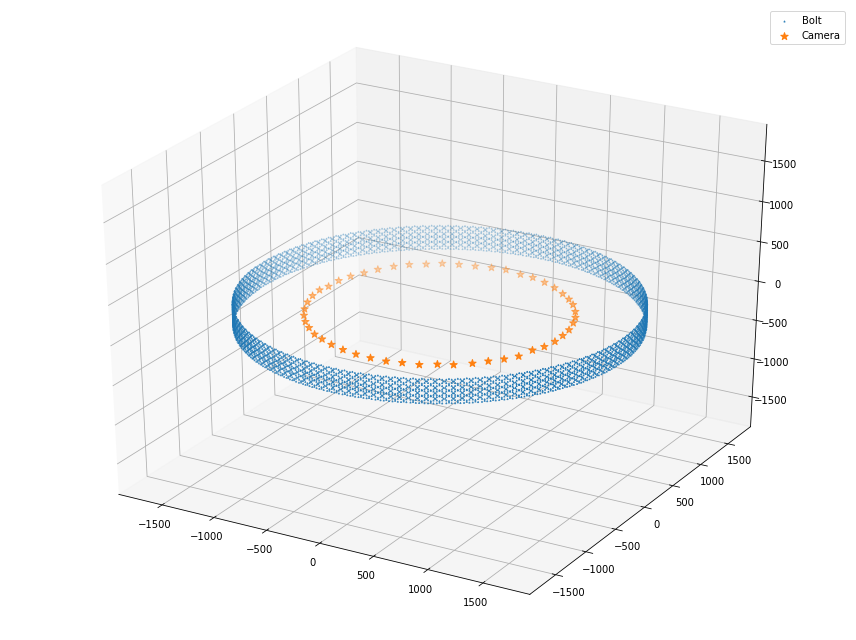

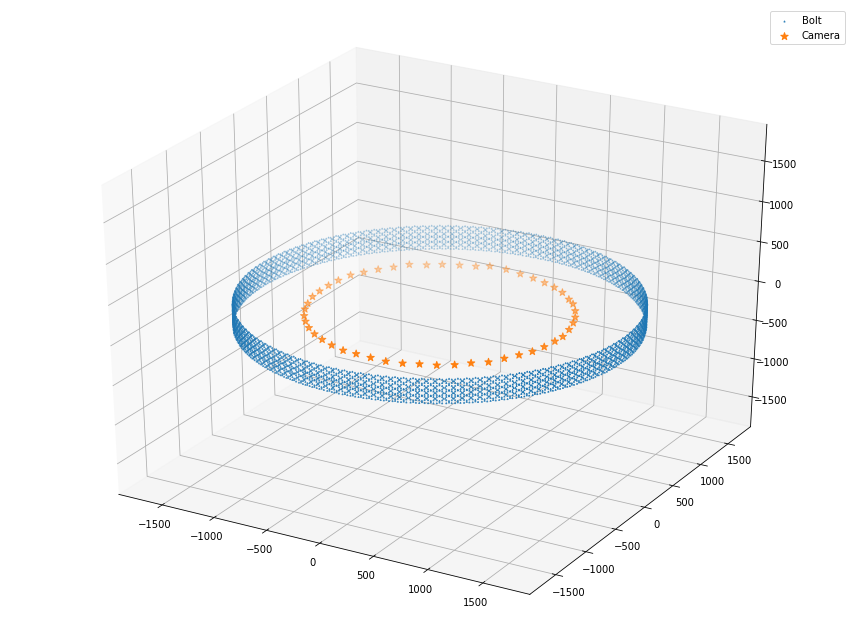

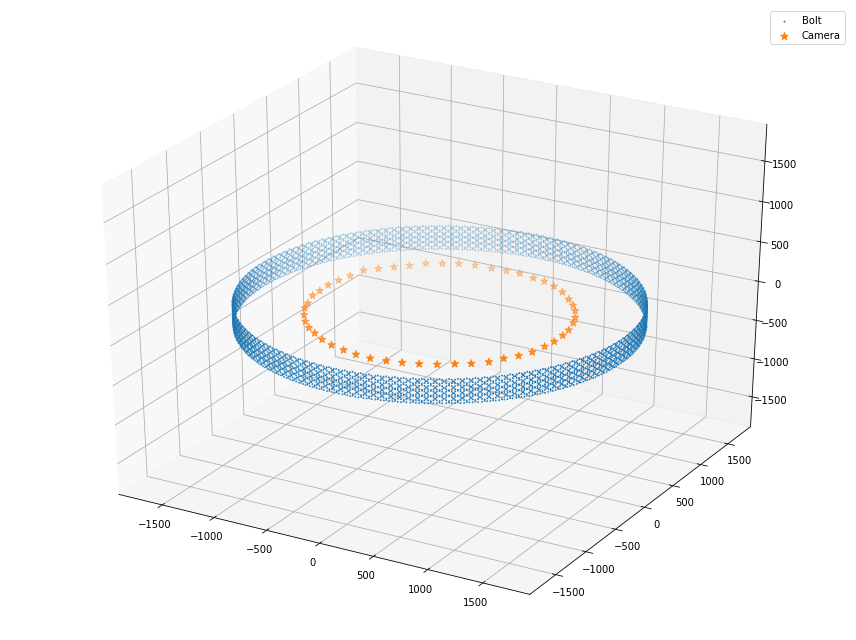

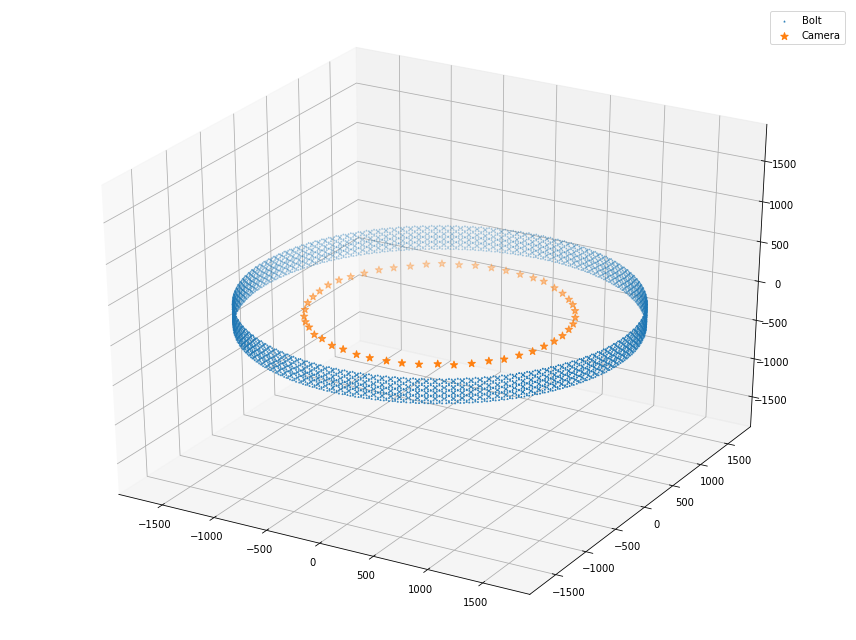

In [26]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 12 bolts

Feature in image counts: Counter({4: 15120, 5: 1724, 3: 406})


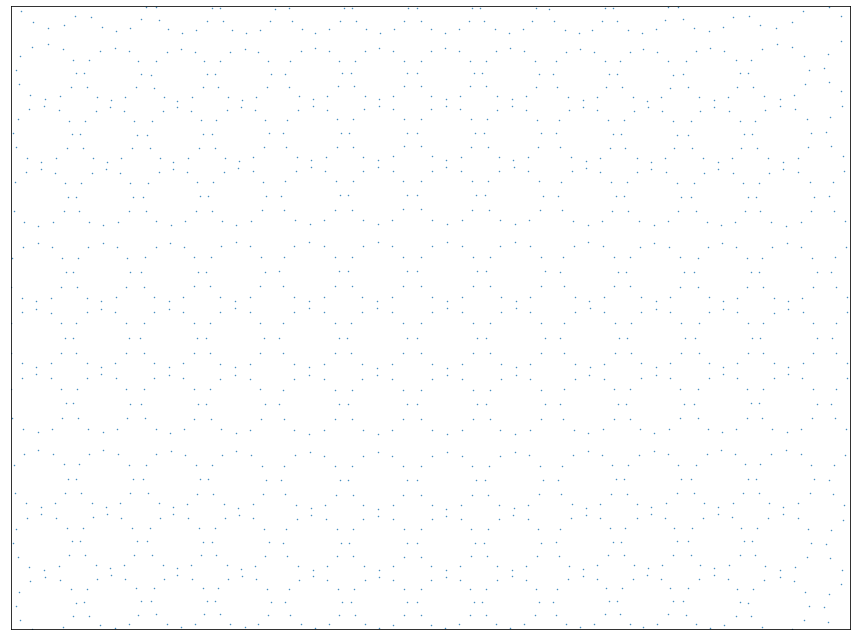

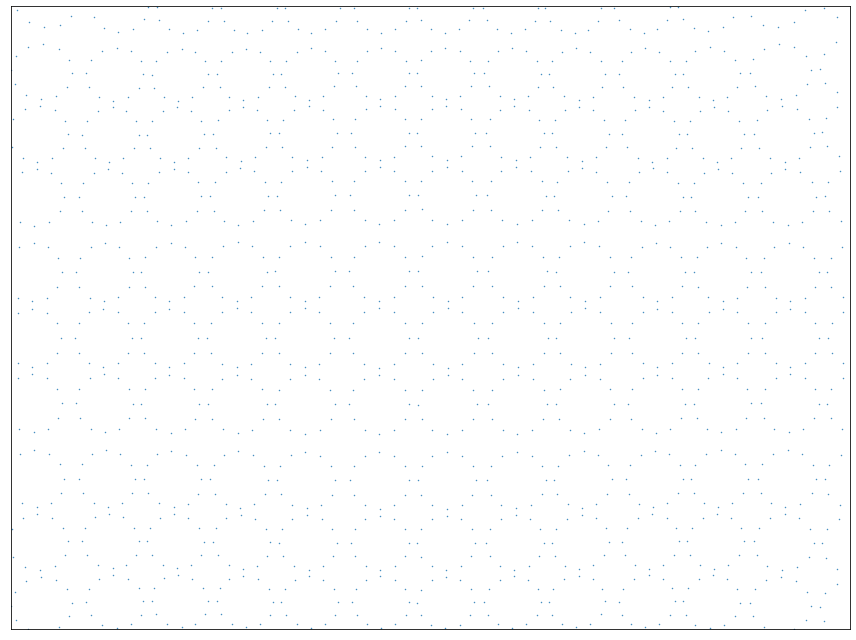

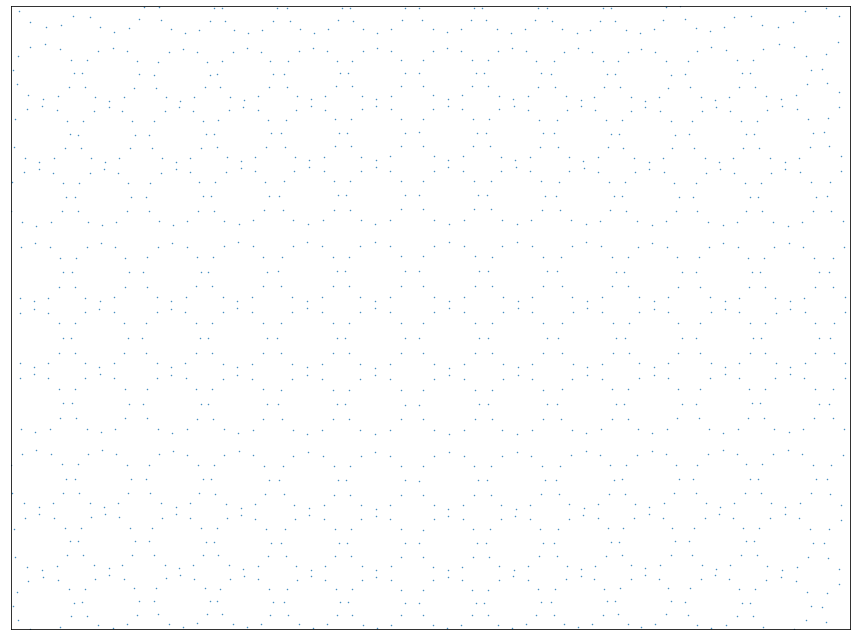

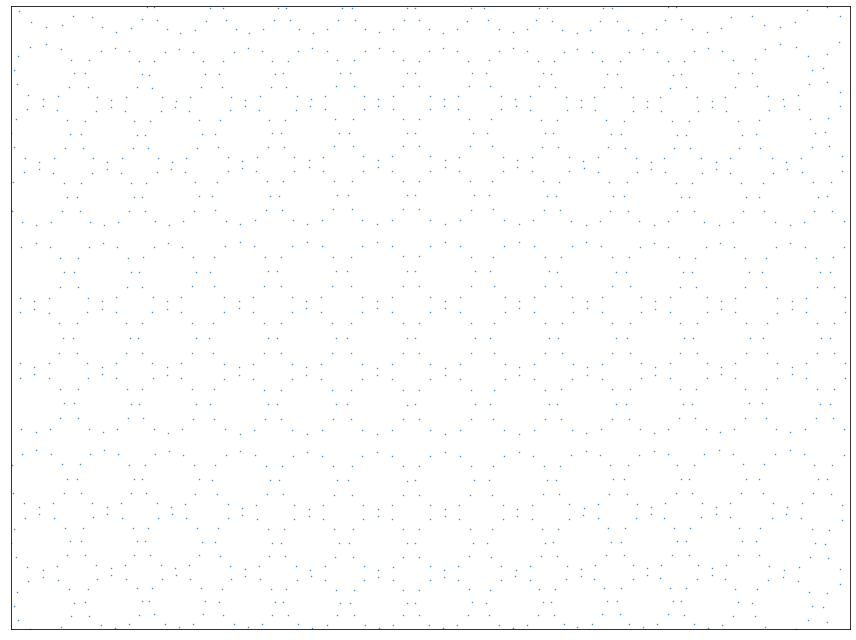

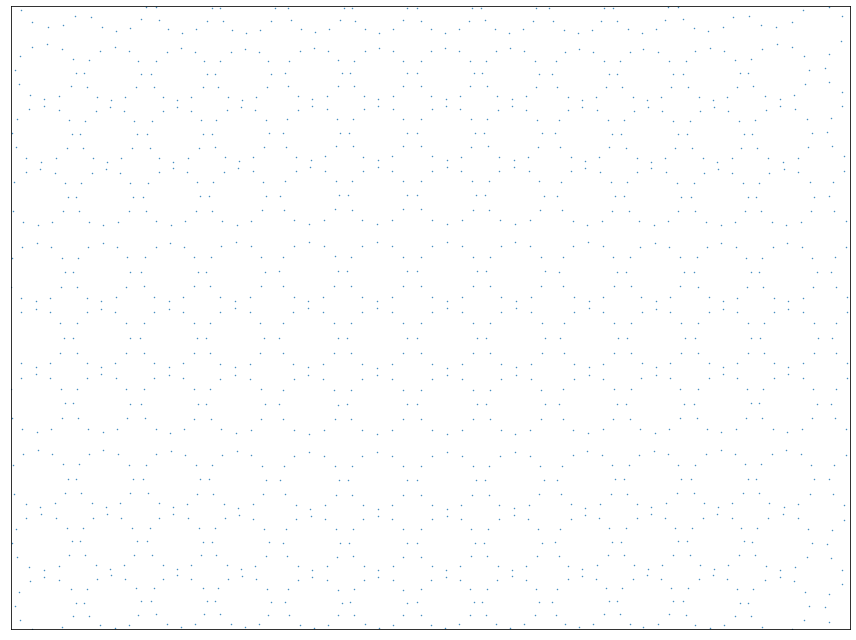

...

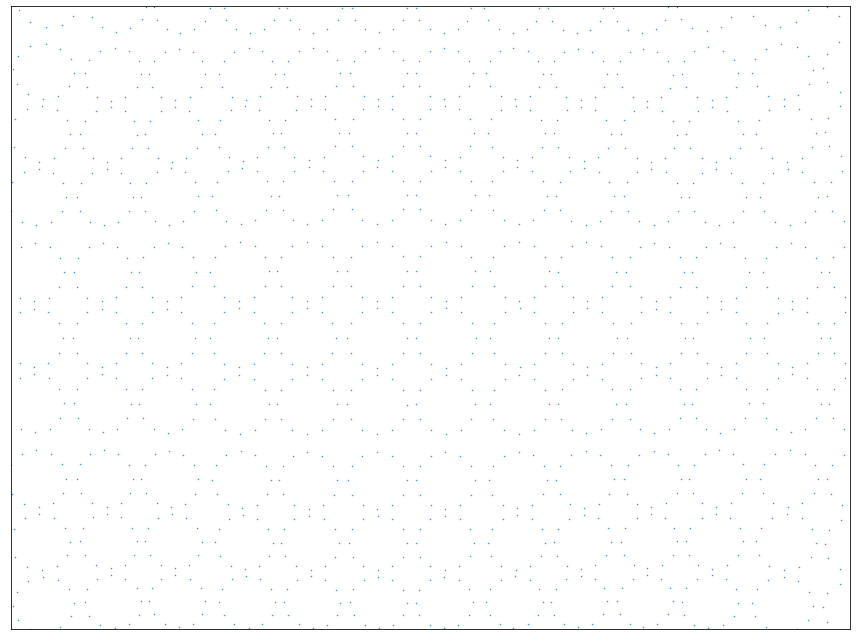

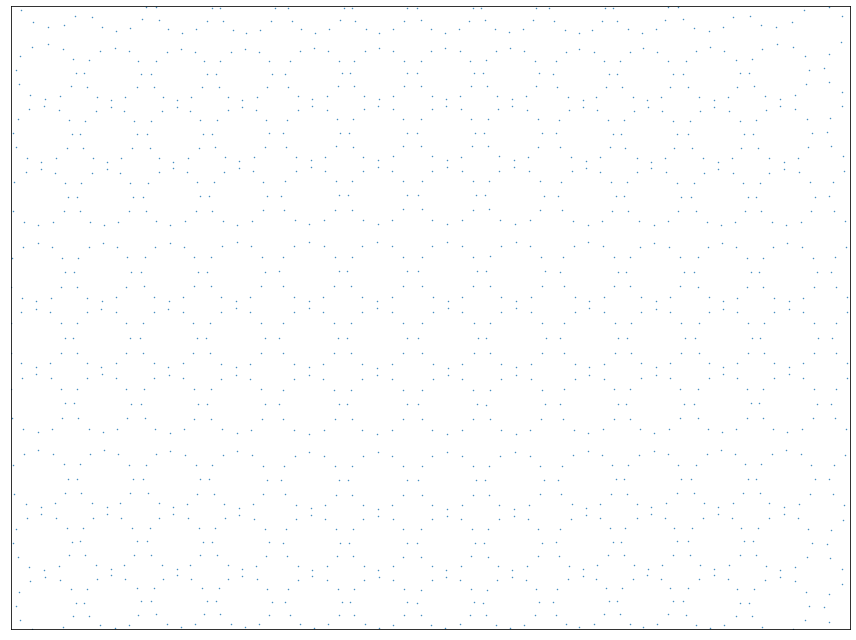

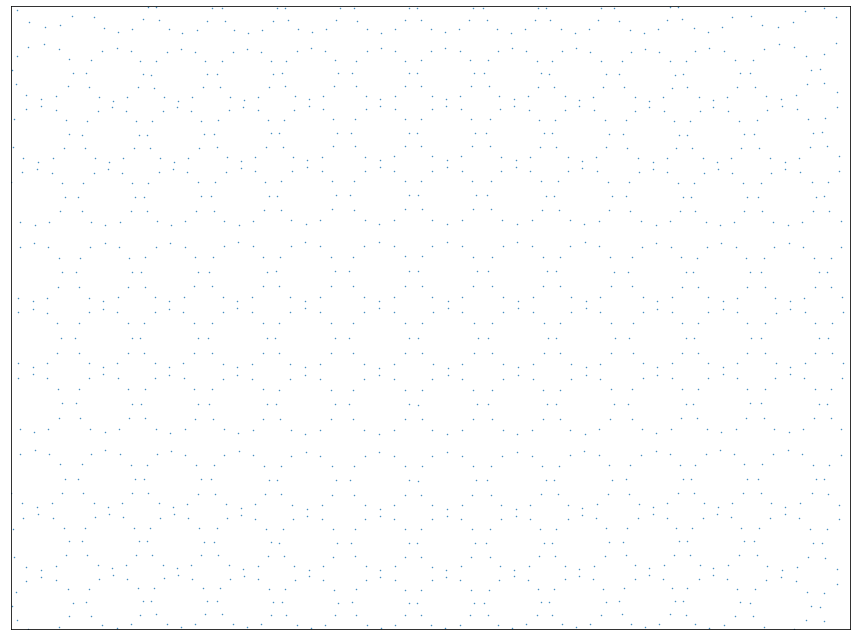

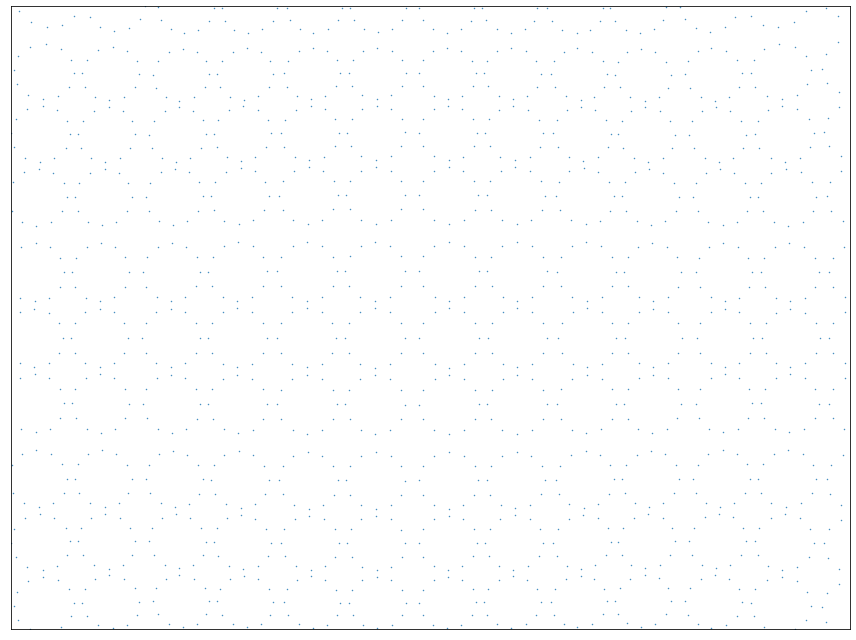

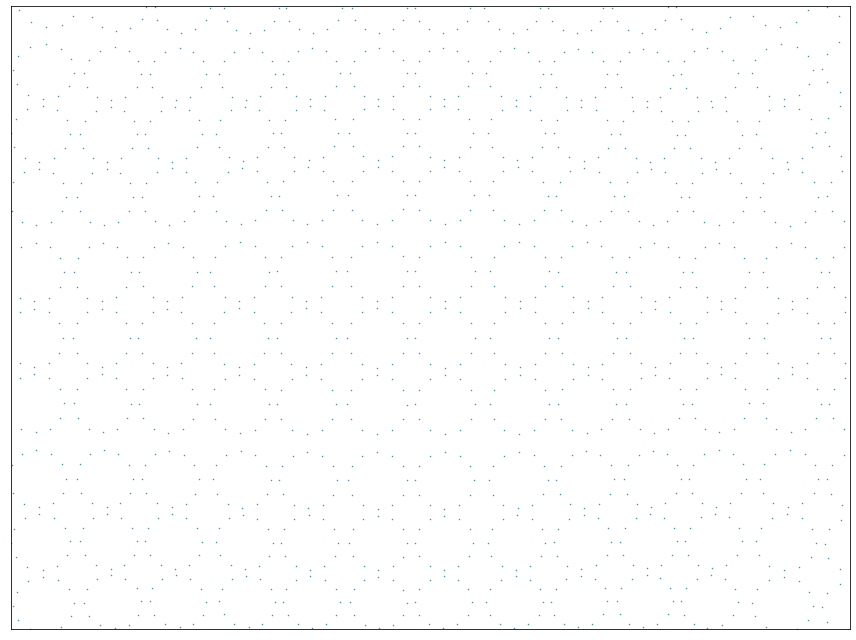

In [27]:
bolt_count = 12
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 15819, 3: 231})
50 images with total of  16050 features
image 0 reprojection errors:    average: 6.091783019715593    max: 20.587626684269285
image 1 reprojection errors:    average: 6.154778841942072    max: 18.216557087537534
image 2 reprojection errors:    average: 6.515285233379724    max: 17.395686177768937
image 3 reprojection errors:    average: 6.269613427295074    max: 18.685730842969082
image 4 reprojection errors:    average: 6.234837452136644    max: 17.890574467694467
image 5 reprojection errors:    average: 6.08803342564804    max: 18.16280620517013
image 6 reprojection errors:    average: 6.031924053765018    max: 17.44302420260379
image 7 reprojection errors:    average: 5.900461628922391    max: 20.05522575594422
image 8 reprojection errors:    average: 6.101374254788533    max: 19.517273511487396
image 9 reprojection errors:    average: 6.084208015792682    max: 16.95196146617

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         7.7103e+05                                    8.53e+06    
       1              2         2.5743e+04      7.45e+05       1.80e+02       2.27e+04    
       2              3         2.1722e+04      4.02e+03       1.19e+01       1.69e+03    
       3              4         2.1487e+04      2.36e+02       1.69e+00       1.36e+03    
`xtol` termination condition is satisfied.
Function evaluations 4, initial cost 7.7103e+05, final cost 2.1487e+04, first-order optimality 1.36e+03.
mean reprojection error: 1.00025044849749
max reprojection error: 6.221683746070577
mean reconstruction error: 0.822118615224794
max reconstruction error: 3.8657649376560568
=== Gaussian errors on feature image locations: 2.0 ===
Feature in image counts: Counter({2: 15819, 3: 231})
50 images with total of  16050 features
image 0 reprojection errors:    average: 6.111308813648178    max: 20.9068

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         9.4732e+05                                    6.20e+06    
       1              2         1.0636e+05      8.41e+05       1.91e+02       2.90e+04    
       2              3         1.0162e+05      4.74e+03       1.35e+01       4.57e+03    
       3              4         1.0119e+05      4.37e+02       1.06e+00       5.38e+02    
`xtol` termination condition is satisfied.
Function evaluations 4, initial cost 9.4732e+05, final cost 1.0119e+05, first-order optimality 5.38e+02.
mean reprojection error: 2.2130145950202125
max reprojection error: 7.898814609339906
mean reconstruction error: 0.9776896123240328
max reconstruction error: 4.172839172275716


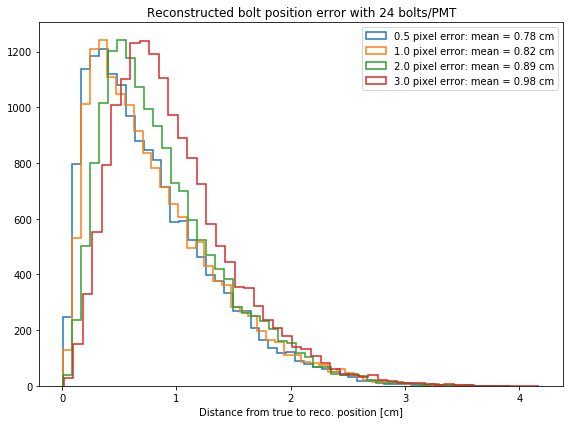

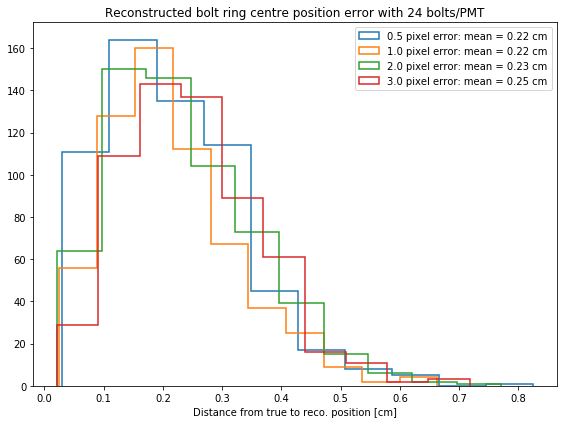

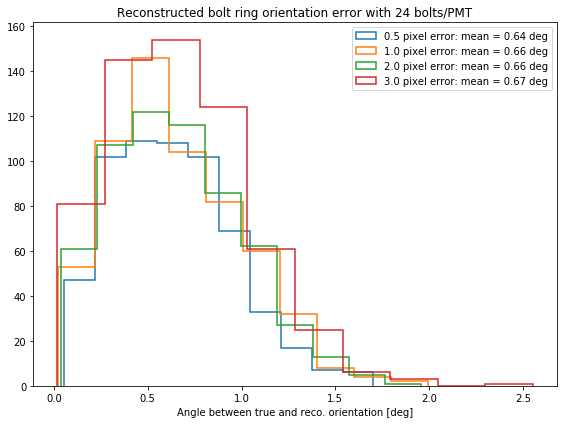

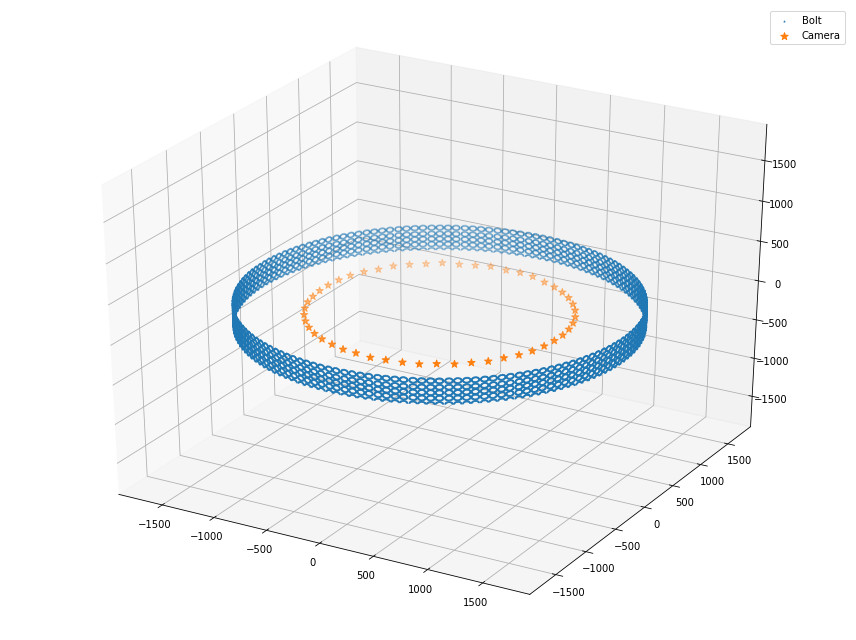

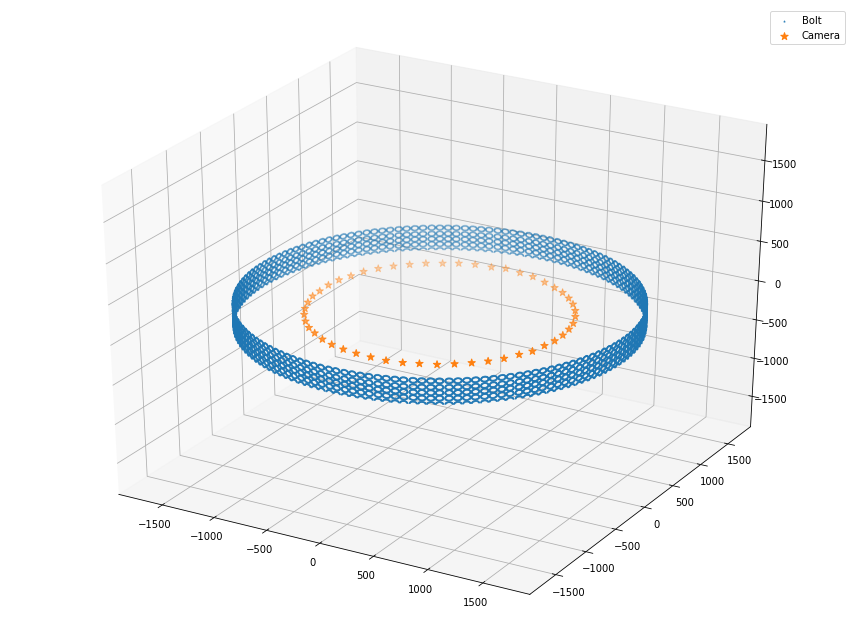

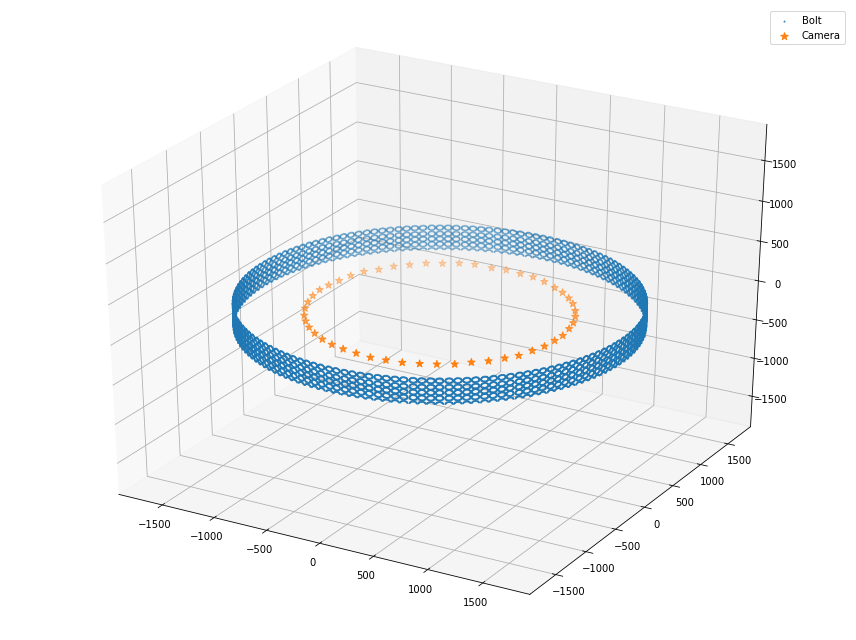

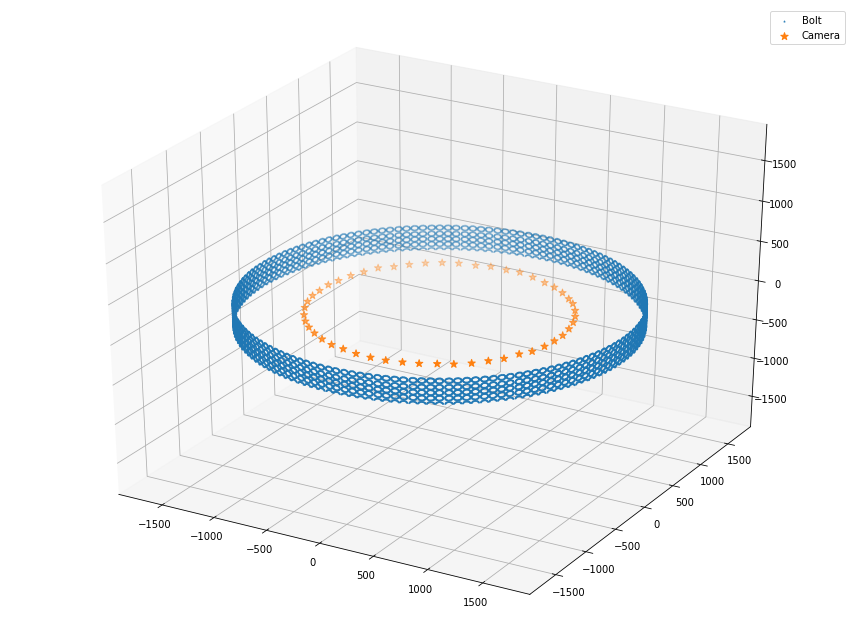

In [31]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 24 bolts

Feature in image counts: Counter({4: 30171, 5: 3473, 3: 706})


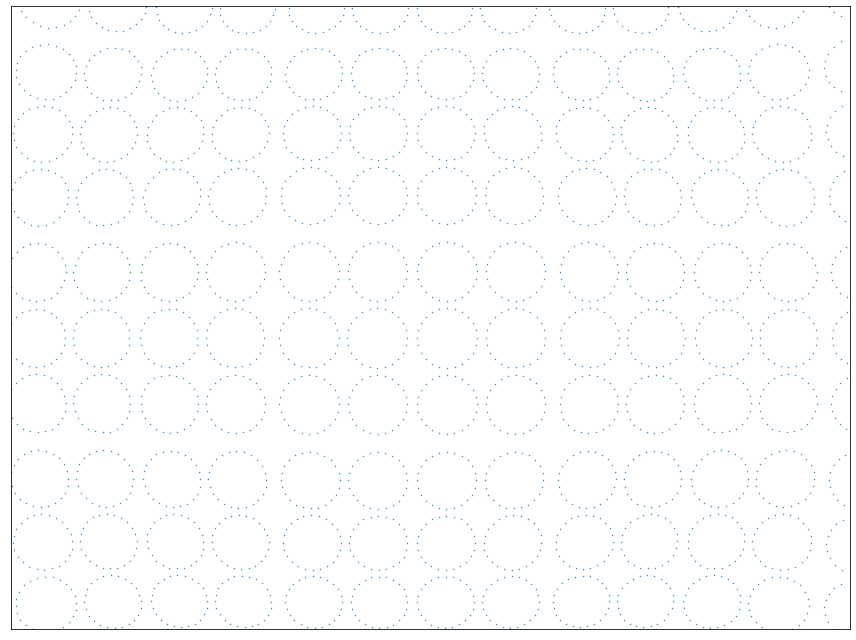

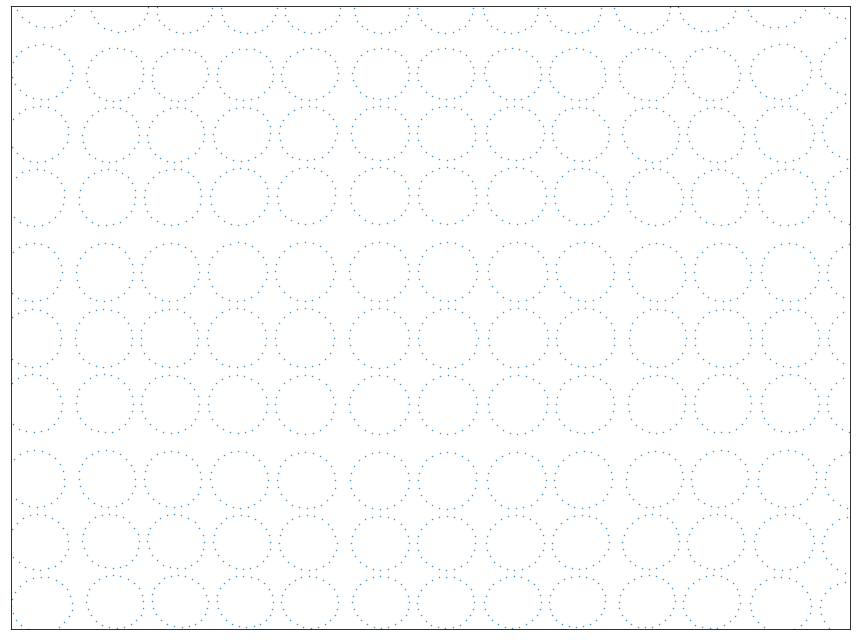

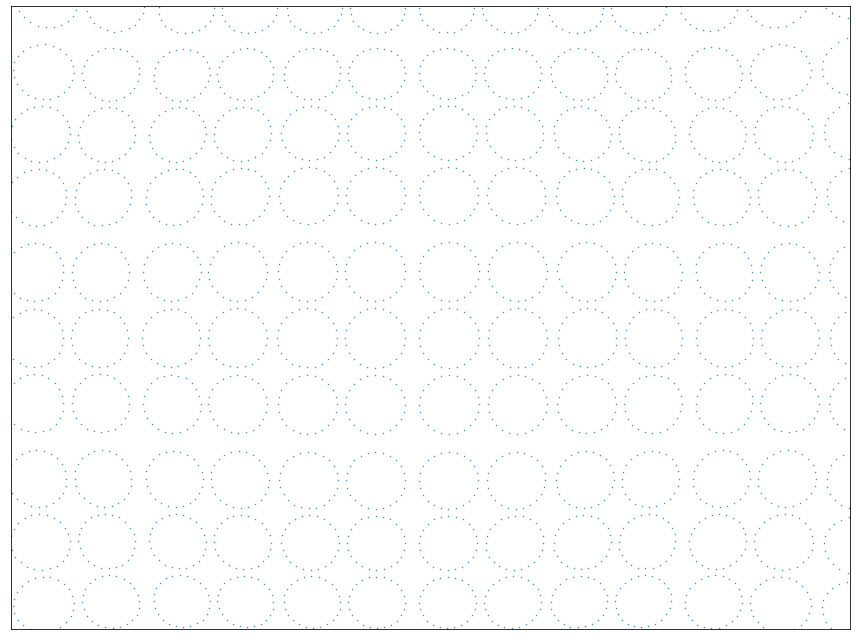

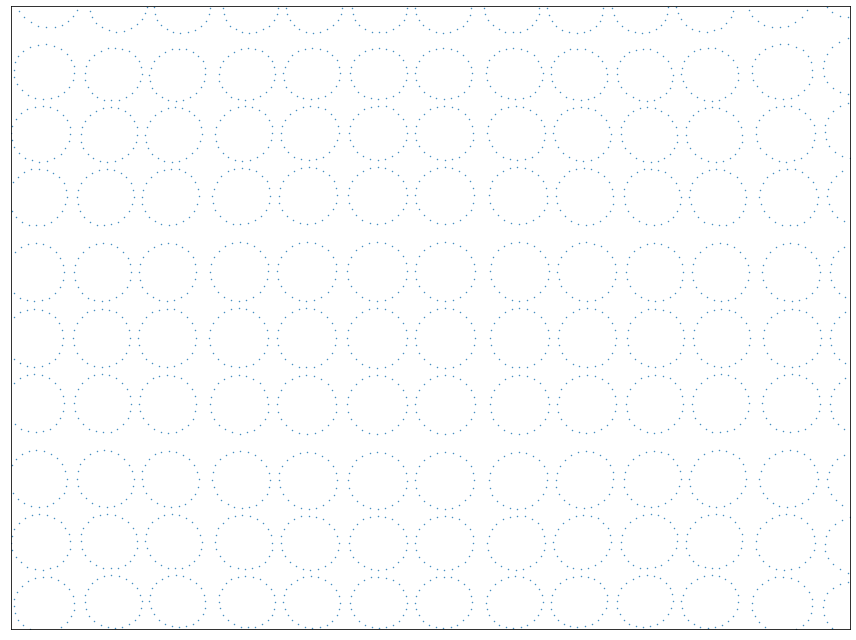

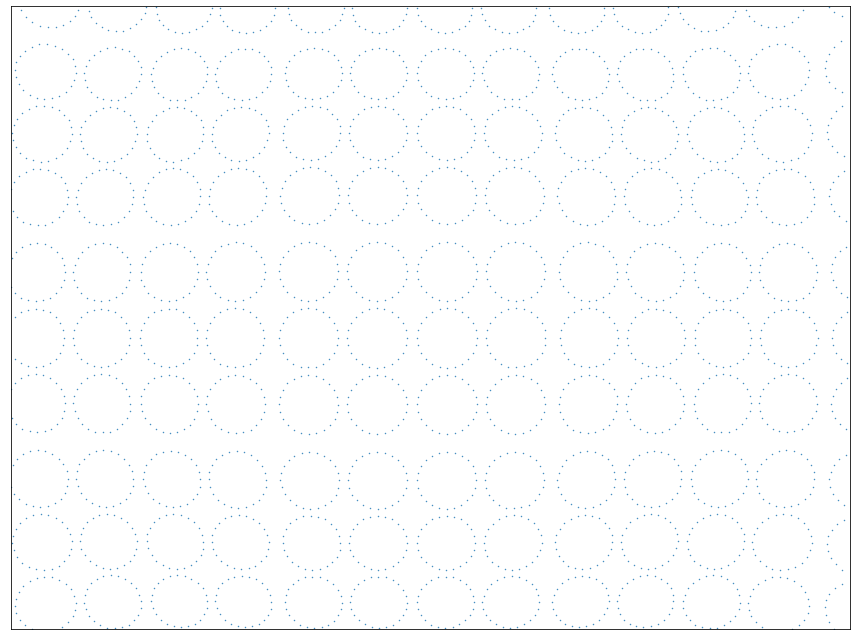

...

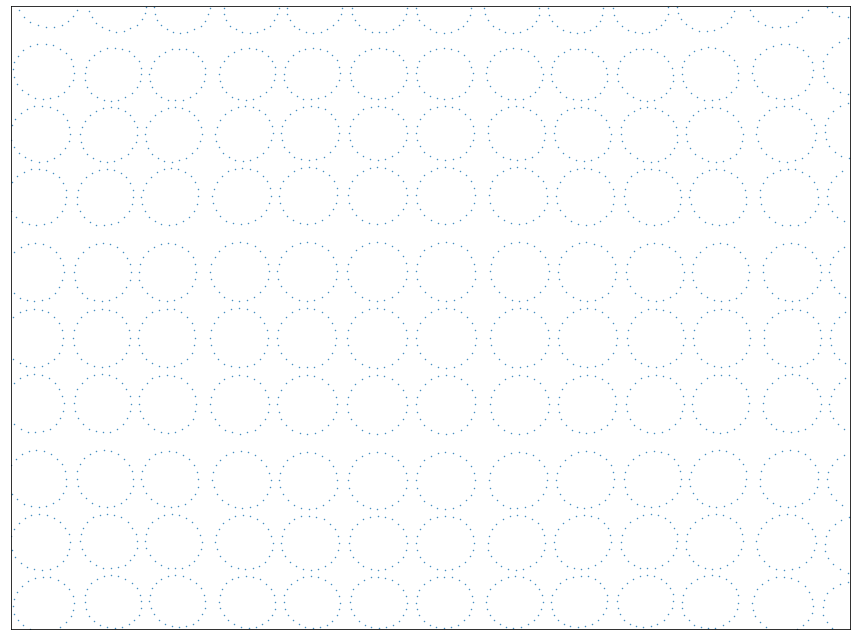

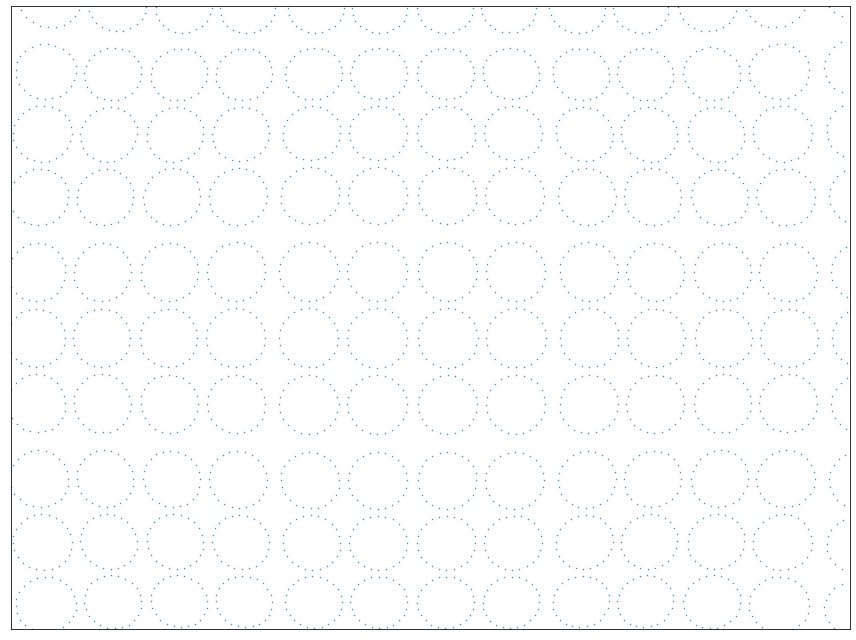

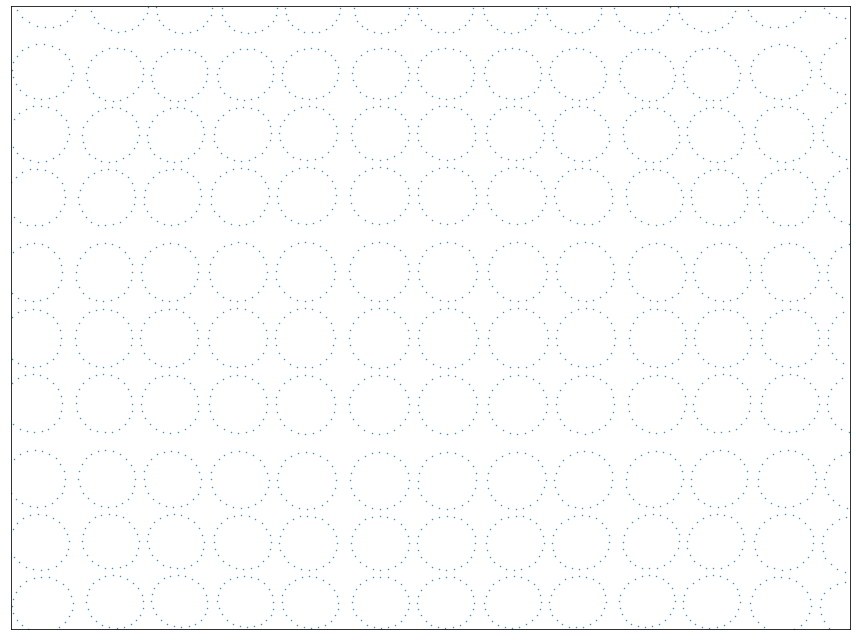

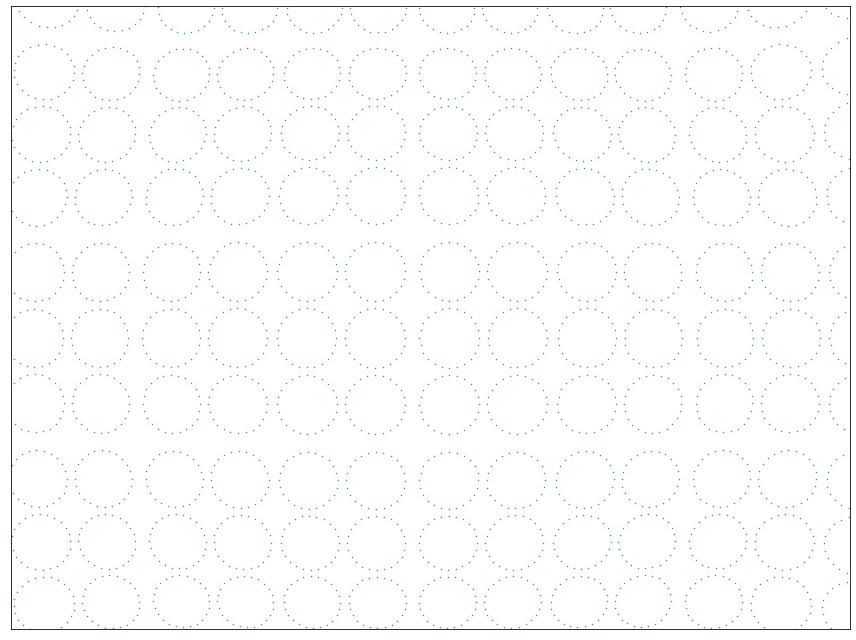

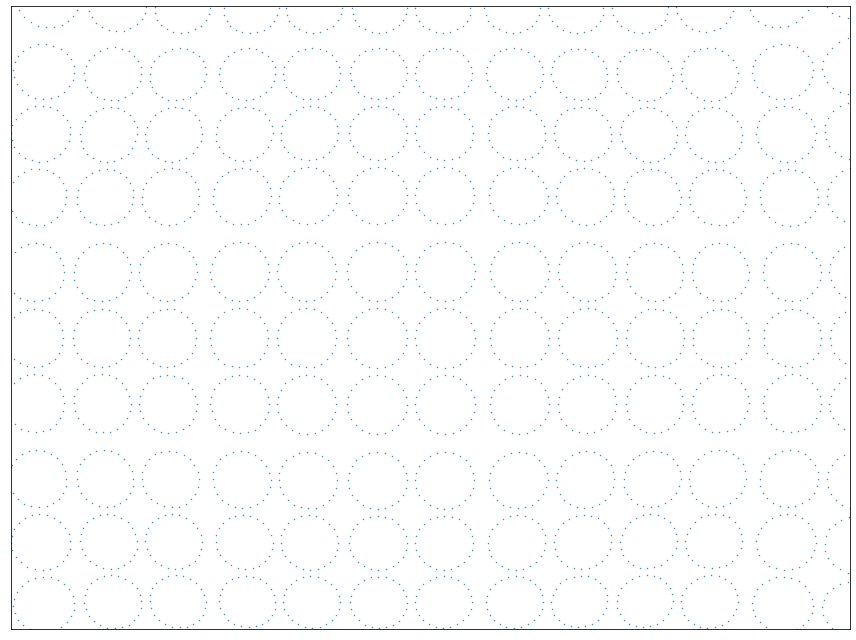

In [32]:
bolt_count = 24
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 15819, 3: 231})
50 images with total of  16050 features
image 0 reprojection errors:    average: 6.095149280635677    max: 17.348201873718647
image 1 reprojection errors:    average: 6.240148215395399    max: 16.129742905011263
image 2 reprojection errors:    average: 6.0174201433219245    max: 20.556370806820638
image 3 reprojection errors:    average: 5.789603261519673    max: 20.570736607321933
image 4 reprojection errors:    average: 6.09611018019454    max: 16.104495367787052
image 5 reprojection errors:    average: 6.250711001036499    max: 16.09304414678292
image 6 reprojection errors:    average: 6.063530305306636    max: 16.920271554496246
image 7 reprojection errors:    average: 5.989739922652225    max: 19.09080233587836
image 8 reprojection errors:    average: 6.029120717000322    max: 17.799752109957588
image 9 reprojection errors:    average: 5.927958493442107    max: 17.168889572

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         7.6843e+05                                    5.93e+06    
       1              2         2.3526e+04      7.45e+05       1.80e+02       5.82e+04    
       2              3         1.9672e+04      3.85e+03       1.14e+01       3.81e+03    
       3              4         1.9537e+04      1.35e+02       9.98e-01       2.89e+03    
`xtol` termination condition is satisfied.
Function evaluations 4, initial cost 7.6843e+05, final cost 1.9537e+04, first-order optimality 2.89e+03.
mean reprojection error: 0.9640677246628703
max reprojection error: 4.744927094815322
mean reconstruction error: 0.8274521086555915
max reconstruction error: 3.9951159730494052
=== Gaussian errors on feature image locations: 2.0 ===
Feature in image counts: Counter({2: 15819, 3: 231})
50 images with total of  16050 features
image 0 reprojection errors:    average: 6.319941187963474    max: 19.6

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         9.3902e+05                                    6.54e+06    
       1              2         1.0748e+05      8.32e+05       1.90e+02       2.06e+04    
       2              3         1.0273e+05      4.75e+03       1.37e+01       7.85e+03    
       3              4         1.0235e+05      3.78e+02       1.01e+00       2.01e+03    
`xtol` termination condition is satisfied.
Function evaluations 4, initial cost 9.3902e+05, final cost 1.0235e+05, first-order optimality 2.01e+03.
mean reprojection error: 2.226248044514963
max reprojection error: 8.584627258032077
mean reconstruction error: 0.9775969764215175
max reconstruction error: 3.849045087731954


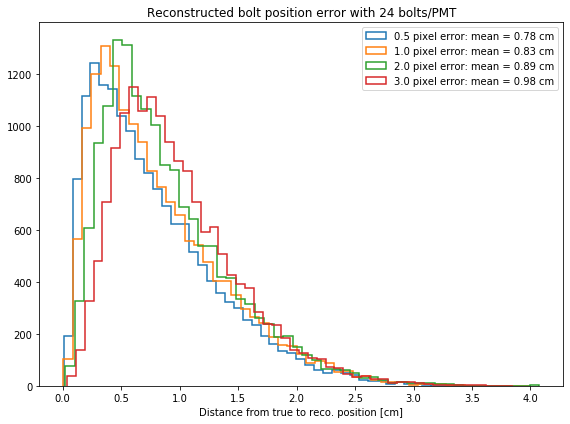

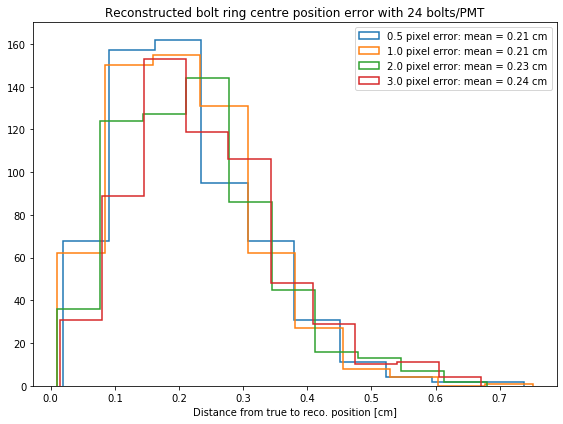

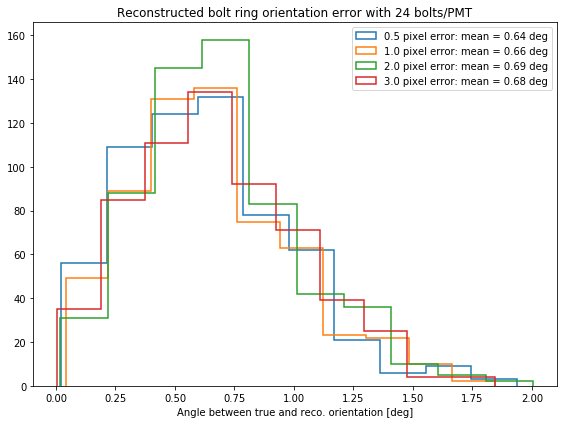

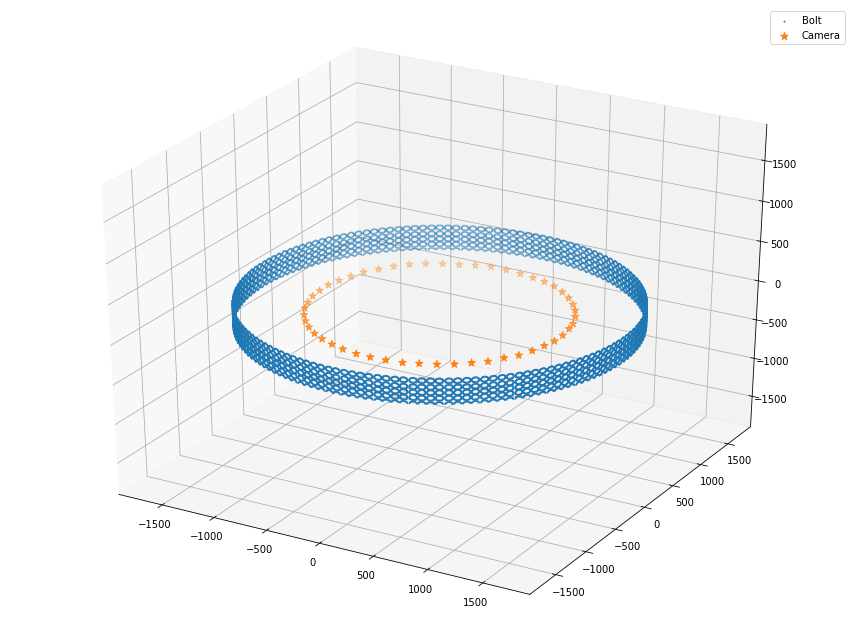

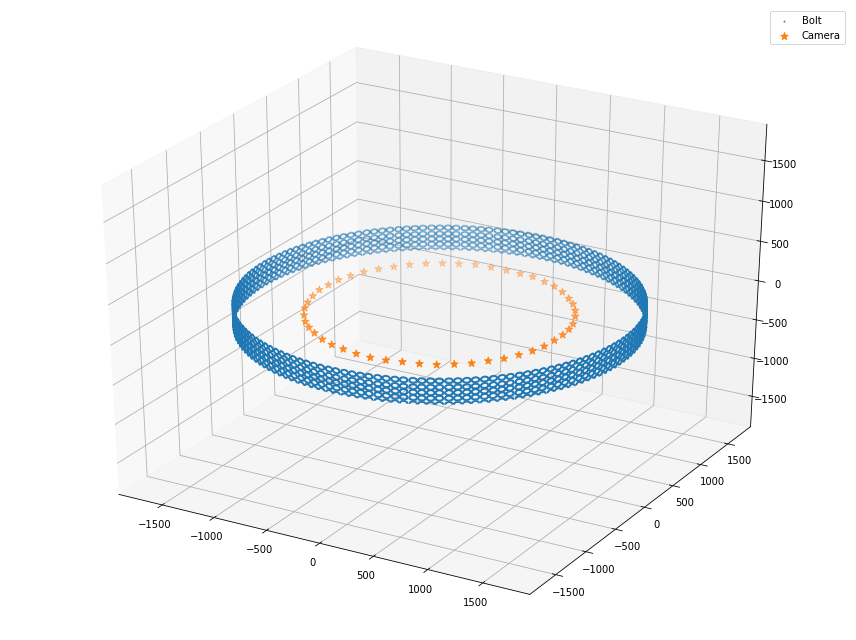

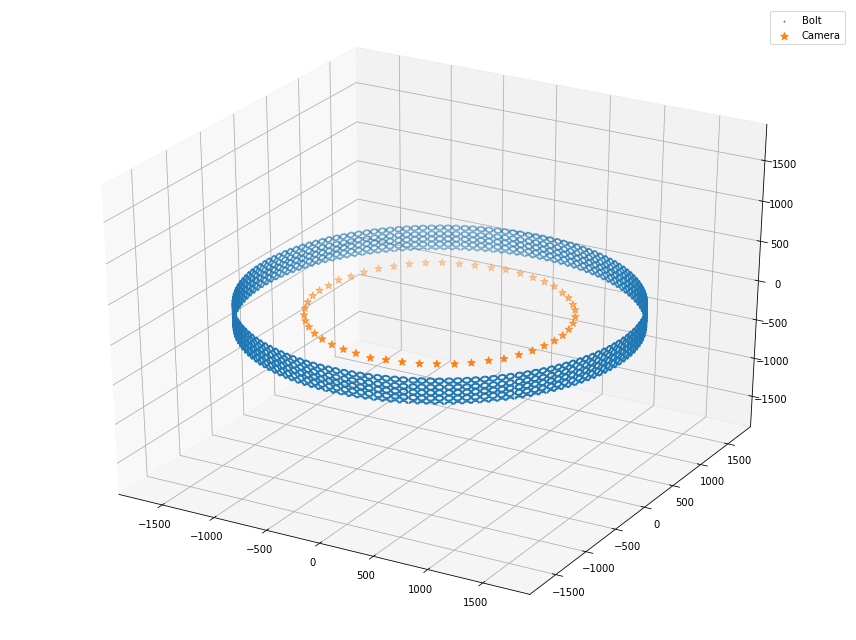

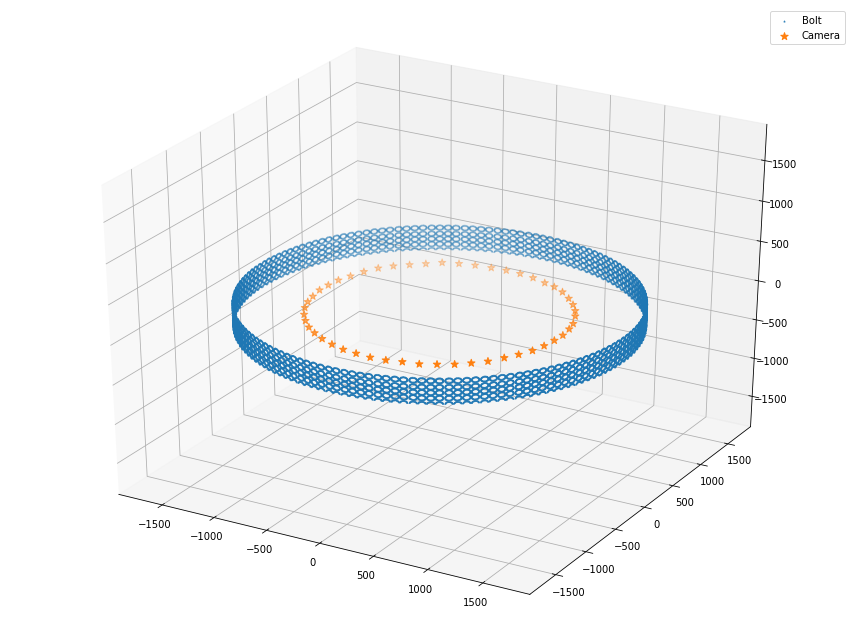

In [33]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')